# <br><br><center>The Import/Export Agricultural Dataset 

The import/export agricultural dataset is a time series data set with per-year information about the crops and livestocks products imported and exported in Europe for 2015-2021. It recorded the domain Code, domain, area Code (M49), area, element Code, element, Item Code (CPC), Item, Year Code, Year, Unit, Value, domain area, domain, flag, and flag description. The dataset is a CSV file, and it was downloaded from The Food and Agriculture Organization Statistical data set(FAOSTAT) website. It is available at: https://www.fao.org/faostat/en/#data/TCL

International trade mainly includes import and export processing. Importing is the act of a nation's people, corporations, and government purchasing goods and services from elsewhere, regardless of how they are delivered to the home country. while export refers to selling products/goods from the home country to other countries. A nation experiences a trade deficit when its imports exceed its exports. A nation that imports less than it exports develops a trade surplus. Simultaneously, increasing the Gross domestic product (GDP) became the main target for all countries to expand their exports[1]. 

<br>

my Github account: https://github.com/RehamTousoun/Agri_InIreland
        

## Loading the neccessary libraries and packages

In [1]:
# Import standard packages 
import pandas as pd  
import numpy as np                       # Numerical Python, the fundamental package for scientific computing in Python.            
import seaborn as sns
from statsmodels.stats import weightstats
import scipy.stats as stats
from scipy.stats import shapiro
import geopandas as gpd
import plotly.express as px
import plotly.graph_objs as go
import matplotlib                    # pyplot module
import pprint                        # pretty-print lists, tuples, & dictionaries recursively
import matplotlib.pyplot as plt

from matplotlib.figure import Figure
from matplotlib.backends.backend_agg import FigureCanvas


In [2]:
# Taking care of jupyter environment 
# show graphs in-line, and turn on/off pretty_printing of lists
%matplotlib inline 
%pprint       

Pretty printing has been turned OFF


In [3]:
#ignore warning 
import warnings
warnings.filterwarnings("ignore")

In [4]:
# retina quality: to better display the plots. Any display with retina resolution will make the figures look better
# if your monitor's resolution is sub-retina than the improvement will be less noticeable [2].
%config InlineBackend.figure_format = 'retina'
sns.set_context('talk')

In [5]:
# Find the current working directory.
import os
os.getcwd()
# for dirname, _, filenames in os.walk('C:\Users\Reham\Desktop\Agriculture2022'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

'C:\\Users\\Reham\\Desktop\\CA2@Agriculture'

<br>

## Exploratory Data Analysis(EDA)

##### Reading Data from Files

In [6]:
# Read the dataset from the CSV file
df = pd.read_csv('EU-AgriTrade.csv')       #https://www.fao.org/faostat/en/#data/TCL

In [7]:
# df-copy = df.copy()             # Keep a copy from the original dataframe

##### Observing and describing data

In [8]:
# Display the first five obsevations on the dataframe
df.head() 

,Domain Code,Domain,Area Code,Area,Item Code (CPC),Item(M49),Flag,Flag Description,Unit,2015,2016,2017,2018,2019,2020,2021,Element,Element Code
0,TCL,Crops and livestock products,40,Austria,F2071,Bovine Meat,A,Official figure,1000 US$,543817.90,500433.84,550245.07,561087.62,546331.84,526121.43,589371.34,Export Value,5922
1,TCL,Crops and livestock products,40,Austria,F1944,Cereals,A,Official figure,1000 US$,413436.91,416309.32,451317.42,433067.23,461881.52,527424.05,592326.72,Export Value,5922
2,TCL,Crops and livestock products,40,Austria,F1887,Dairy Products,A,Official figure,1000 US$,1219787.92,1196282.33,1314954.84,1423163.86,1369810.97,1483644.97,1532730.09,Export Value,5922
3,TCL,Crops and livestock products,40,Austria,F1782,Eggs,A,Official figure,1000 US$,22726.14,25483.68,33349.16,44926.90,44929.20,43546.00,30247.17,Export Value,5922
4,TCL,Crops and livestock products,40,Austria,F1892,Fodder and Feeding Stuff,A,Official figure,1000 US$,756577.02,748014.60,838420.14,961041.09,949072.54,1041044.61,1194880.85,Export Value,5922


In [9]:
# Display the last five obsevations on the dataframe
df.tail()

,Domain Code,Domain,Area Code,Area,Item Code (CPC),Item(M49),Flag,Flag Description,Unit,2015,2016,2017,2018,2019,2020,2021,Element,Element Code
589,TCL,Crops and livestock products,752,Sweden,F1773,Nuts,A,Official figure,1000 US$,251063.81,225130.63,220816.01,227193.19,209162.45,224364.57,207191.20,Import Value,5622
590,TCL,Crops and livestock products,752,Sweden,F2073,Pigmeat (meat equivalent),A,Official figure,1000 US$,424883.07,427979.44,440407.52,422689.69,382819.55,343641.80,343867.54,Import Value,5622
591,TCL,Crops and livestock products,752,Sweden,F2074,Poultry Meat,A,Official figure,1000 US$,307418.85,316147.55,312791.25,314796.00,297301.27,276413.82,323630.54,Import Value,5622
592,TCL,Crops and livestock products,752,Sweden,F1719,Roots and Tubers,A,Official figure,1000 US$,100054.45,105071.86,107971.08,120492.54,125109.90,112131.92,126831.09,Import Value,5622
593,TCL,Crops and livestock products,752,Sweden,F1734,Vegetables,A,Official figure,1000 US$,990683.82,1039542.46,1082611.22,1109479.71,1065114.74,1097804.98,1154693.85,Import Value,5622


In [10]:
# .shape() method returns a tuple representing the dimensionality of the DataFrame, 
# which means the number of rows and columns in our data frame[5].
df.shape

(594, 18)

<font color='red'>The dataset contains 594 rows and 18 columns.</font>

In [11]:
df.columns

Index(['Domain Code', 'Domain', 'Area Code', 'Area', 'Item Code (CPC)',
       'Item(M49)', 'Flag', 'Flag Description', 'Unit', '2015', '2016', '2017',
       '2018', '2019', '2020', '2021', 'Element', 'Element Code'],
      dtype='object')

The dataset contains 594 rows and 18 columns:
Domain Code: TCL
Domain: Crops and livestock products	
Area Code (M49): the code for each country in EU region.
Area: EU-countries 
Item Code (CPC): the code for each production.
Item(M49): The production exported by each country in EU region.
Flag: The flag for this dataset has 7 values:
E --> Estimated value
X --> Figure from international organizations
F --> Forecast value
I --> Imputed value
M --> Missing value (data cannot exist, not applicable)
A --> Official figure
T --> Unofficial figure

Flag Description: display the flag discreption
Unit: 1000 United States dollars	
Year: 2015-2021 the values of commodities exported in 1000$ over 2015-2021 
Element: Import or export
Element Code: code for import and export

**1- Dropping the redundant columns.**

We will drop the redundant columns to make the data easier to visualise. 

To determine which columns are not necessary for the analysis. We defined a **displayColumnsValues()** function to have a deep look at all the columns' values in our data set. 

In [12]:
# Python Docstrings [6]: is an in-built feature for commenting on functions, modules, methods, objects, and classes.
# They are written between three quotation marks (‘’ or “”) in the first line after defining a  function, method, etc.
# We can access a docstrings by utilising the \__doc__ attribute. 
def displayColumnsValues(data):
    '''displayColumnsValues() is a function with one argument (dataframe). When the function is called, 
        we pass along the dataframe, which is used inside the function to print the unique values for each feature (column)
        .nunique(): Count number of distinct elements in each column. 
        .unique() method returns an array with the unique values.'''
    for i in data.columns:
        print(80*'=','\n',i,'has',
          df[i].nunique(),'value/s:\n',
          df[i].unique()) 

In [13]:
# calling the displayColumnsValues() function
displayColumnsValues(df) 

 Domain Code has 1 value/s:
 ['TCL']
 Domain has 1 value/s:
 ['Crops and livestock products']
 Area Code has 27 value/s:
 [ 40  56 100 191 196 203 208 233 246 250 276 300 348 372 380 428 440 442
 470 528 616 620 642 703 705 724 752]
 Area has 27 value/s:
 ['Austria' 'Belgium' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia' 'Denmark'
 'Estonia' 'Finland' 'France' 'Germany' 'Greece' 'Hungary' 'Ireland'
 'Italy' 'Latvia' 'Lithuania' 'Luxembourg' 'Malta' 'Netherlands' 'Poland'
 'Portugal' 'Romania' 'Slovakia' 'Slovenia' 'Spain' 'Sweden']
 Item Code (CPC) has 11 value/s:
 ['F2071' 'F1944' 'F1887' 'F1782' 'F1892' 'F1802' 'F1773' 'F2073' 'F2074'
 'F1719' 'F1734']
 Item(M49) has 11 value/s:
 ['Bovine Meat ' 'Cereals ' 'Dairy Products ' 'Eggs '
 'Fodder and Feeding Stuff ' 'Fruit ' 'Nuts ' 'Pigmeat (meat equivalent) '
 'Poultry Meat ' 'Roots and Tubers ' 'Vegetables ']
 Flag has 1 value/s:
 ['A' nan]
 Flag Description has 1 value/s:
 ['Official figure ' nan]
 Unit has 1 value/s:
 ['1000 US$' nan]
 2015

We have missing values in some columns, We clean the data later on.

Now we can drop unuseful columns that do not help in our analysis like:
* 'Area Code (M49)'
* Flag','Flag Description','Unit' --> contain only one value, not add any new information for the analysis,  
* 'Domain Code', 'Area Code','Item Code (CPC)', 'Element Code' --> will use the 'Domain', 'Area', 'Item' and 'Element' instead,

<br>**Which method del or .drop() to drop the columns?**
*  del is an in-place operation, delete one column at a time.
* .drop() can use on both columns or rows, drop one on multiple items at a time, and operate in-place or return a copy [4]. We are going to use .drop() to drop the previous columns.

In [14]:
# Display the dataframe heading
df.columns

Index(['Domain Code', 'Domain', 'Area Code', 'Area', 'Item Code (CPC)',
       'Item(M49)', 'Flag', 'Flag Description', 'Unit', '2015', '2016', '2017',
       '2018', '2019', '2020', '2021', 'Element', 'Element Code'],
      dtype='object')

In [15]:
# Unnecessary columns dropped from the data frame to make the focus on the remaining columns easier using .drop() method.
df.drop(['Domain Code','Area Code', 'Item Code (CPC)', 'Flag','Flag Description','Unit', 'Element Code'],axis=1,inplace=True)

In [16]:
df.head()

,Domain,Area,Item(M49),2015,2016,2017,2018,2019,2020,2021,Element
0,Crops and livestock products,Austria,Bovine Meat,543817.90,500433.84,550245.07,561087.62,546331.84,526121.43,589371.34,Export Value
1,Crops and livestock products,Austria,Cereals,413436.91,416309.32,451317.42,433067.23,461881.52,527424.05,592326.72,Export Value
2,Crops and livestock products,Austria,Dairy Products,1219787.92,1196282.33,1314954.84,1423163.86,1369810.97,1483644.97,1532730.09,Export Value
3,Crops and livestock products,Austria,Eggs,22726.14,25483.68,33349.16,44926.90,44929.20,43546.00,30247.17,Export Value
4,Crops and livestock products,Austria,Fodder and Feeding Stuff,756577.02,748014.60,838420.14,961041.09,949072.54,1041044.61,1194880.85,Export Value


**2- Renaming the columns for clarity.**

In [17]:
New_headers = ['Domain','Region','Production','2015', '2016', 
               '2017', '2018', '2019','2020', '2021','Trade']
df.columns = New_headers

In [18]:
df.head(2)

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Trade
0,Crops and livestock products,Austria,Bovine Meat,543817.90,500433.84,550245.07,561087.62,546331.84,526121.43,589371.34,Export Value
1,Crops and livestock products,Austria,Cereals,413436.91,416309.32,451317.42,433067.23,461881.52,527424.05,592326.72,Export Value


Put all the price in Millions $ instead of Thousand \\$.

In [19]:
df.iloc[:,3:10] = df.iloc[:,3:10]/10**3

In [20]:
df.head()

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Trade
0,Crops and livestock products,Austria,Bovine Meat,543.81790,500.43384,550.24507,561.08762,546.33184,526.12143,589.37134,Export Value
1,Crops and livestock products,Austria,Cereals,413.43691,416.30932,451.31742,433.06723,461.88152,527.42405,592.32672,Export Value
2,Crops and livestock products,Austria,Dairy Products,1219.78792,1196.28233,1314.95484,1423.16386,1369.81097,1483.64497,1532.73009,Export Value
3,Crops and livestock products,Austria,Eggs,22.72614,25.48368,33.34916,44.92690,44.92920,43.54600,30.24717,Export Value
4,Crops and livestock products,Austria,Fodder and Feeding Stuff,756.57702,748.01460,838.42014,961.04109,949.07254,1041.04461,1194.88085,Export Value


**3- Replace the values in 'Element' column for easier reading.**

In [21]:
# .replace() method applied to the 'Element' column to replace the 'Import Value' to'Import', andthe'Export Value' to 'Export'
df['Trade'].replace({'Import Value':'Import',
                      'Export Value':'Export'},inplace=True)

In [22]:
# Display the first two rows
df.head(2)

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Trade
0,Crops and livestock products,Austria,Bovine Meat,543.81790,500.43384,550.24507,561.08762,546.33184,526.12143,589.37134,Export
1,Crops and livestock products,Austria,Cereals,413.43691,416.30932,451.31742,433.06723,461.88152,527.42405,592.32672,Export


**4- Add new column 'Total Groos'**

In [23]:
# .insert() method used to insert the new column 'Price' in a specific position 12, that contain the import/export price in Euro 
# .sum() to Sum the rows f each column
df.insert(10, 'Total Gross',(df.iloc[:,3:10].sum(1)))

In [24]:
df.head(2)

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Total Gross,Trade
0,Crops and livestock products,Austria,Bovine Meat,543.81790,500.43384,550.24507,561.08762,546.33184,526.12143,589.37134,3817.40904,Export
1,Crops and livestock products,Austria,Cereals,413.43691,416.30932,451.31742,433.06723,461.88152,527.42405,592.32672,3295.76317,Export


**5- Observing the dataset.**

A quick look at our data again.

In [25]:
# .info(): return all information about the dataframe 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 594 entries, 0 to 593
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Domain       594 non-null    object 
 1   Region       594 non-null    object 
 2   Production   594 non-null    object 
 3   2015         592 non-null    float64
 4   2016         593 non-null    float64
 5   2017         592 non-null    float64
 6   2018         592 non-null    float64
 7   2019         593 non-null    float64
 8   2020         594 non-null    float64
 9   2021         593 non-null    float64
 10  Total Gross  594 non-null    float64
 11  Trade        594 non-null    object 
dtypes: float64(8), object(4)
memory usage: 55.8+ KB


<font color=red>Will change the dtypes for some columns after cleaning the data.</font> <br>
The data set contains a mixed type of data (object, int64, and float64).
Some null/missing values observed.

In [26]:
# Generate descriptive statistics for the numeric columns, it summarize the central tendency, 
# dispersion and shape of a dataset’s distribution, excluding NaN values [7].
df.describe()

,2015,2016,2017,2018,2019,2020,2021,Total Gross
count,592.000000,593.000000,592.000000,592.000000,593.000000,594.000000,593.000000,594.000000
mean,687.317309,689.661844,769.439332,814.081723,797.700898,832.426772,916.516747,5495.451768
std,1316.090477,1327.257521,1492.595449,1572.892742,1531.633828,1632.579736,1765.817321,10596.788948
min,0.000600,0.000310,0.002520,0.016480,0.000710,0.000110,0.000220,0.000110
25%,42.687753,44.433390,48.397645,54.088843,53.574240,52.633567,63.424490,360.912648
50%,171.322585,173.633290,188.064680,213.988355,213.815980,205.034715,239.113390,1390.165370
75%,638.632627,638.602640,727.363137,777.405805,769.523470,782.629365,858.300350,5255.910488
max,9418.755030,9833.310610,10637.496440,11379.889380,10322.373430,11761.589200,12043.376210,75396.790300


**count:** gives the total values for each column. It appears that '2015','2017','2018' have 2 missing values
    and '2016','2019','2021'contain one missing value each.
    
**Range = max - min**
the range of data for:
    '2015' is 0-9418.7
    '2016' is 0-9833.3
    '2017' is 0-10637.4
    '2018' is 0-11379.8
    '2019' is 0-10322.3
    '2020' is 0-11761.5
    '2021' is 0-12043.3
    'Total Gross' is 5495.45 - 75396.790

All the year features have the minimum value of zero because some of the import and export productions over the time series from 2015-2021 may not be traded in any EU country at a specific year.   

IQ3 or 75% values for the year columns '2015'-'2021' are considered small regarding its maximum values, which indicates an outlier not clear if this outlier on the import prices or export prices will see later.
    

In [27]:
# Select the categorical columns
df.describe(include='O')

,Domain,Region,Production,Trade
count,594,594,594,594
unique,1,27,11,2
top,Crops and livestock products,Austria,Bovine Meat,Export
freq,594,22,54,297


For the object data type. The result includes 'count', 'unique', 'top', and 'freq'
'top' gives the most common values while 'freq' gives the most common value frequency. 

In [28]:
# .count() non-NA cells for each column or row
df.count()

Domain         594
Region         594
Production     594
2015           592
2016           593
2017           592
2018           592
2019           593
2020           594
2021           593
Total Gross    594
Trade          594
dtype: int64

**6- Cleaning Data.**

In [29]:
#checking the duplicated values
df.duplicated().any()

False

<font color='red'>No duplicated rows were observed in our data set.</font>

In [30]:
# Null values, the totall number of missing values at each column
df.isnull().sum()

Domain         0
Region         0
Production     0
2015           2
2016           1
2017           2
2018           2
2019           1
2020           0
2021           1
Total Gross    0
Trade          0
dtype: int64

<font color='red'>Our data set contain missing values, Let's have a deep look to the missing values by displaying the percentage of the missing values.</font>

In [31]:
# Percentege of missing values in the data frame
df.isna().sum()/(len(df))*100

Domain         0.00000
Region         0.00000
Production     0.00000
2015           0.33670
2016           0.16835
2017           0.33670
2018           0.33670
2019           0.16835
2020           0.00000
2021           0.16835
Total Gross    0.00000
Trade          0.00000
dtype: float64

The percentage of missing values between 0.16% to 0.33%, which can be dropped without any effect on our analysis


In [32]:
# drop the missing value for O Connell St and Henrt street
df.dropna(axis = 0,inplace = True)

**7- Change the data type for some features**

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 591 entries, 0 to 593
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Domain       591 non-null    object 
 1   Region       591 non-null    object 
 2   Production   591 non-null    object 
 3   2015         591 non-null    float64
 4   2016         591 non-null    float64
 5   2017         591 non-null    float64
 6   2018         591 non-null    float64
 7   2019         591 non-null    float64
 8   2020         591 non-null    float64
 9   2021         591 non-null    float64
 10  Total Gross  591 non-null    float64
 11  Trade        591 non-null    object 
dtypes: float64(8), object(4)
memory usage: 60.0+ KB


For the data visualisation and graphing purpose, the price(€m) for the exported crops and livestock productions displayed on the columns '2015' to '2021' dtype changed from float64 to int64, Python rounds down when it converts from floating point to integer. 

In [34]:
# .astype() method used to change the datatypes of columns in our data frame.
df.iloc[:,3:10] = df.iloc[:,3:10].astype('int64') 

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 591 entries, 0 to 593
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Domain       591 non-null    object 
 1   Region       591 non-null    object 
 2   Production   591 non-null    object 
 3   2015         591 non-null    int64  
 4   2016         591 non-null    int64  
 5   2017         591 non-null    int64  
 6   2018         591 non-null    int64  
 7   2019         591 non-null    int64  
 8   2020         591 non-null    int64  
 9   2021         591 non-null    int64  
 10  Total Gross  591 non-null    float64
 11  Trade        591 non-null    object 
dtypes: float64(1), int64(7), object(4)
memory usage: 60.0+ KB


In [36]:
df.head()

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Total Gross,Trade
0,Crops and livestock products,Austria,Bovine Meat,543,500,550,561,546,526,589,3817.40904,Export
1,Crops and livestock products,Austria,Cereals,413,416,451,433,461,527,592,3295.76317,Export
2,Crops and livestock products,Austria,Dairy Products,1219,1196,1314,1423,1369,1483,1532,9540.37498,Export
3,Crops and livestock products,Austria,Eggs,22,25,33,44,44,43,30,245.20825,Export
4,Crops and livestock products,Austria,Fodder and Feeding Stuff,756,748,838,961,949,1041,1194,6489.05085,Export


<br>
<br>

## Data Visualization

**Why is color significant when displaying data?**

Yi, M. (n.d.). How to Choose Colors for Data Visualizations. [online] Chartio. Available at: https://chartio.com/learn/charts/how-to-choose-colors-data-visualization/.

Schloss, K.B., Gramazio, C.C., Silverman, A.T., Parker, M.L. and Wang, A.S. (2019). Mapping Color to Meaning in Colormap Data Visualizations. IEEE Transactions on Visualization and Computer Graphics, 25(1), pp.810–819. doi:10.1109/tvcg.2018.2865147.



Color is crucial in data visualization because it enables you to draw attention to specific information and recall information later. In order for viewers to clearly see major differences or similarities in values, different colors can be used to separate and define different data points within a visualization. To make presented data more memorable, color choices for data visualization should take into account color theories and frequent color associations. Depending on the goal of the visualization report, colors might affect how viewers see data and convince them to feel either positively or adversely.


#### We filtered the data To show the Import and export  commodities in Ireland only

In [37]:
# Selecting all rows crossponding to Ireland area and store them in a new dataframe df_Ireland
df_Ireland = df.loc[df['Region']=='Ireland']  

In [38]:
# display the first five observations from the new data frame df_Ireland
df_Ireland.head()

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Total Gross,Trade
286,Crops and livestock products,Ireland,Bovine Meat,2454,2508,2716,2874,2601,2660,2838,18653.84379,Export
287,Crops and livestock products,Ireland,Cereals,40,18,21,22,36,45,64,249.10032,Export
288,Crops and livestock products,Ireland,Dairy Products,1869,1868,2627,3013,3270,3314,3682,19647.23284,Export
289,Crops and livestock products,Ireland,Eggs,18,13,15,14,17,20,41,141.71600,Export
290,Crops and livestock products,Ireland,Fodder and Feeding Stuff,306,290,339,375,377,416,505,2610.96716,Export


In [39]:
# display the last five observations from the new data frame df_Ireland
df_Ireland.tail()

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Total Gross,Trade
303,Crops and livestock products,Ireland,Nuts,68,65,66,67,65,65,66,464.35743,Import
304,Crops and livestock products,Ireland,Pigmeat (meat equivalent),242,233,276,278,253,312,302,1897.07626,Import
305,Crops and livestock products,Ireland,Poultry Meat,501,497,501,560,520,439,433,3454.39360,Import
306,Crops and livestock products,Ireland,Roots and Tubers,131,157,163,184,185,164,141,1127.96901,Import
307,Crops and livestock products,Ireland,Vegetables,465,488,507,553,538,567,570,3691.90916,Import


In [40]:
# Reset the default index [7]
df_Ireland.reset_index(inplace=True, drop=True)  

The pairplot method from the seaborn library used to get a nice visualisation plot for the pairwise correlation  between all the variables on our dataset.  the pairplot considered a simple tool to understand the data set by summarizing it in one figure.

Let's have a look at the correllation between features:

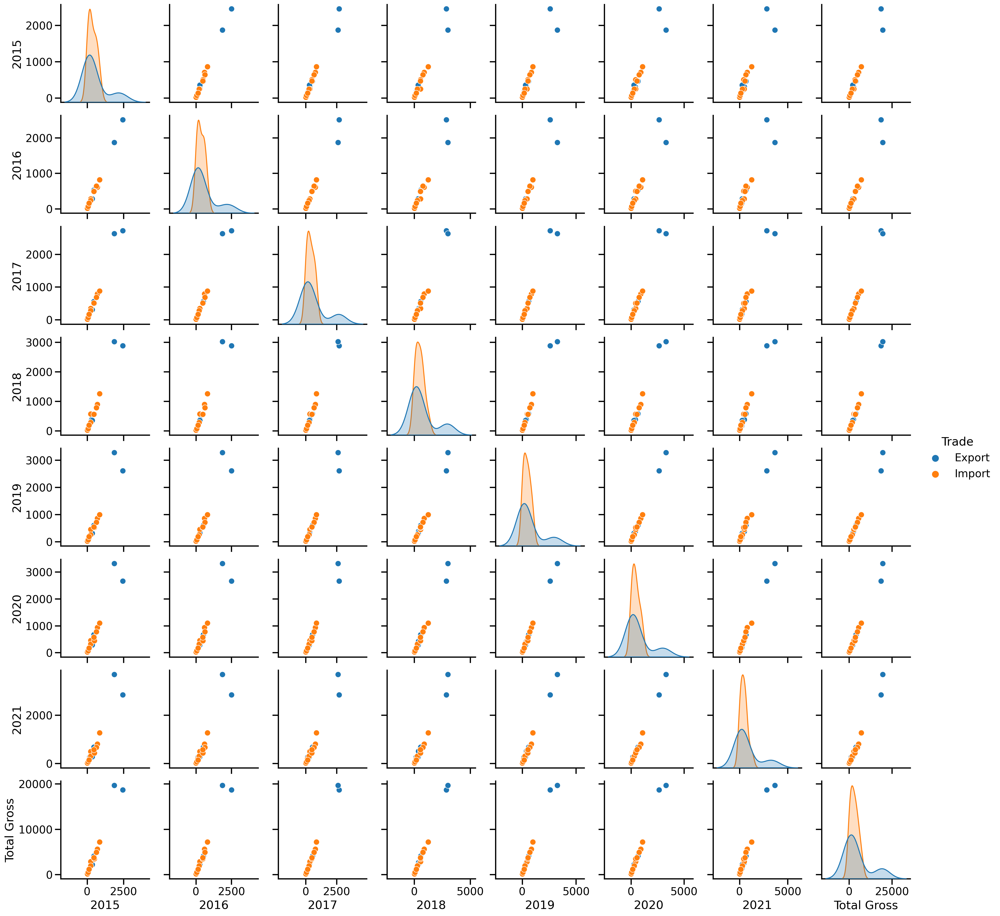

In [41]:
sns.pairplot(df_Ireland,hue='Trade');

We dissplay the correlation between each column in our data frame. A heat map is a two-dimensional plot of the correlation strength (a measure of dependence) between the variables represented by colour. The correlation amount is represented by the colour intensity variation on the heat map. The correlation range is between -1 and +1. There are two types of correlation positive correlation (closer to 1) and negative correlation (closer to -1). The correlation between every two columns on the data set can be represented by a square.  All the values on the diagonal are 1 because it is correlating each variable to itself

<br>

Szabo, B. (2020). How to Create a Seaborn Correlation Heatmap in Python? [online] Medium. Available at: https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e.



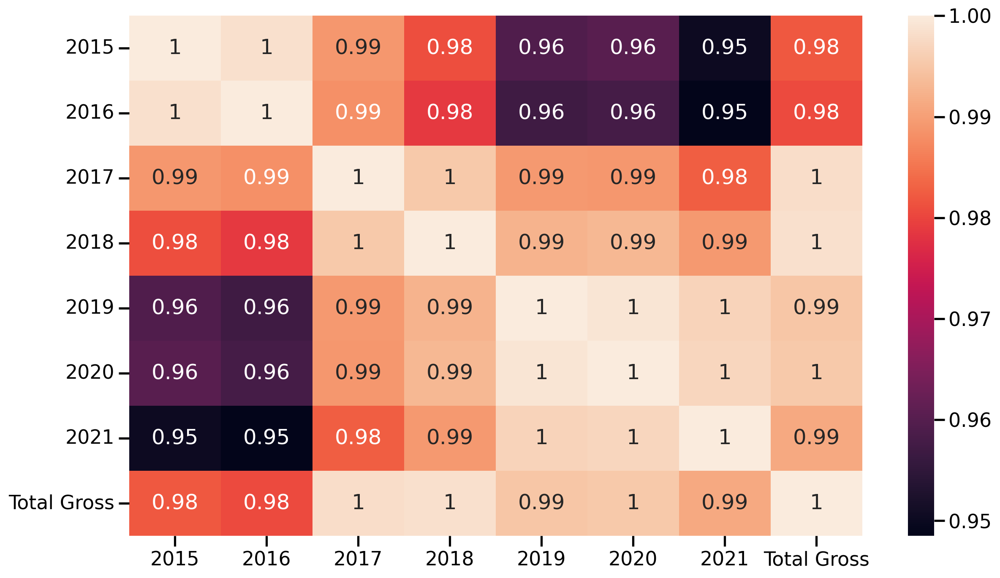

In [42]:
c = df_Ireland.corr()             # Calculate the coerrelation matrix
plt.figure(figsize=(14,8))
sns.heatmap(c,annot=True) 
plt.show()

The heatmap shows a strong positive correklation between the columns in our data set.


In [43]:
df_Ireland.corr()

,2015,2016,2017,2018,2019,2020,2021,Total Gross
2015,1.000000,0.998405,0.989026,0.981010,0.959202,0.960364,0.950255,0.982093
2016,0.998405,1.000000,0.988305,0.978809,0.957060,0.957859,0.948503,0.980624
2017,0.989026,0.988305,1.000000,0.995201,0.989251,0.989055,0.982700,0.998135
2018,0.981010,0.978809,0.995201,1.000000,0.992517,0.993115,0.989244,0.998479
2019,0.959202,0.957060,0.989251,0.992517,1.000000,0.999020,0.996717,0.994851
2020,0.960364,0.957859,0.989055,0.993115,0.999020,1.000000,0.997095,0.995209
2021,0.950255,0.948503,0.982700,0.989244,0.996717,0.997095,1.000000,0.991175
Total Gross,0.982093,0.980624,0.998135,0.998479,0.994851,0.995209,0.991175,1.000000


<br>

**Q1: What is Ireland's total external trade of crops and livestock products over 2015-2021?**

Stack Overflow. (n.d.). pandas - Matplotlib - Adding value labels to bar graph. [online] Available at: https://stackoverflow.com/questions/70235487/matplotlib-adding-value-labels-to-bar-graph [Accessed 4 Jan. 2023].


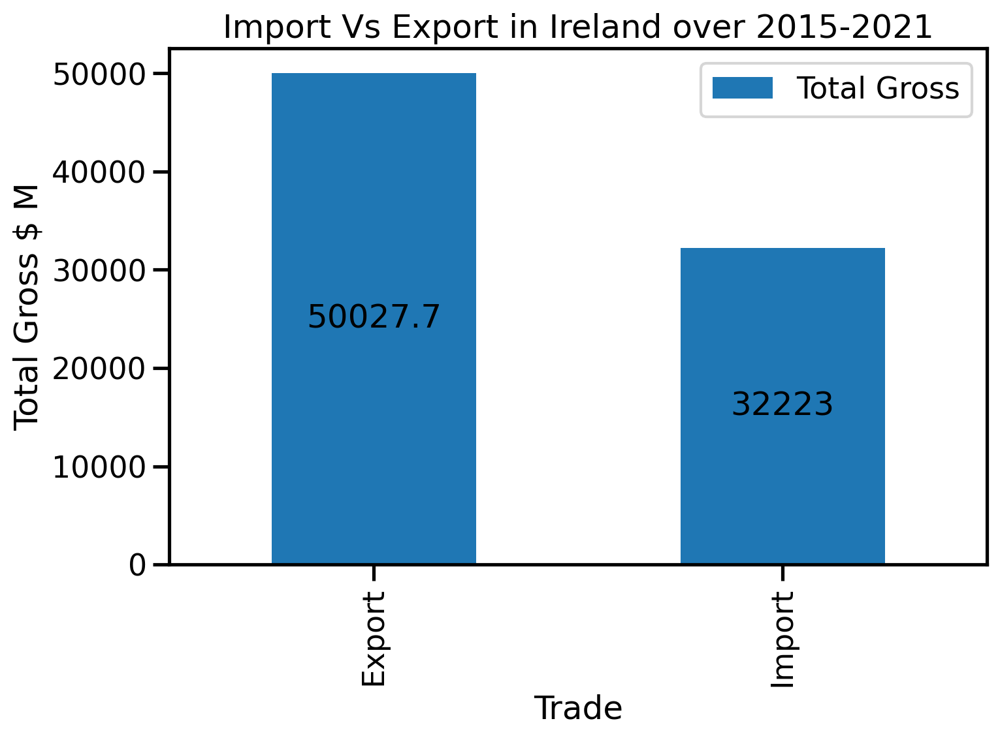

In [44]:
# Bar Plot shows the crops and livestock productions import vs export values in United state $M
ax = df_Ireland.groupby('Trade').sum().plot(y = 'Total Gross',kind='bar', figsize=(8,6), ylabel='Total Gross $ M',
                                           title = 'Import Vs Export in Ireland over 2015-2021')
ax.bar_label(ax.containers[0], label_type='center')
plt.tight_layout()

The %matplotlib magic function configures its integration with the IPython
shell or Jupyter notebook. This is important, as otherwise plots you create will
either not appear (notebook) or take control of the session until closed (shell).[Python for Data Analysis
Data Wrangling with Pandas, NumPy, and IPython, Wes McKinney]

print('Ireland\'s total external trade over 2015-2017 is: Euro',df_Ireland['Total Gross'].sum(),'million')

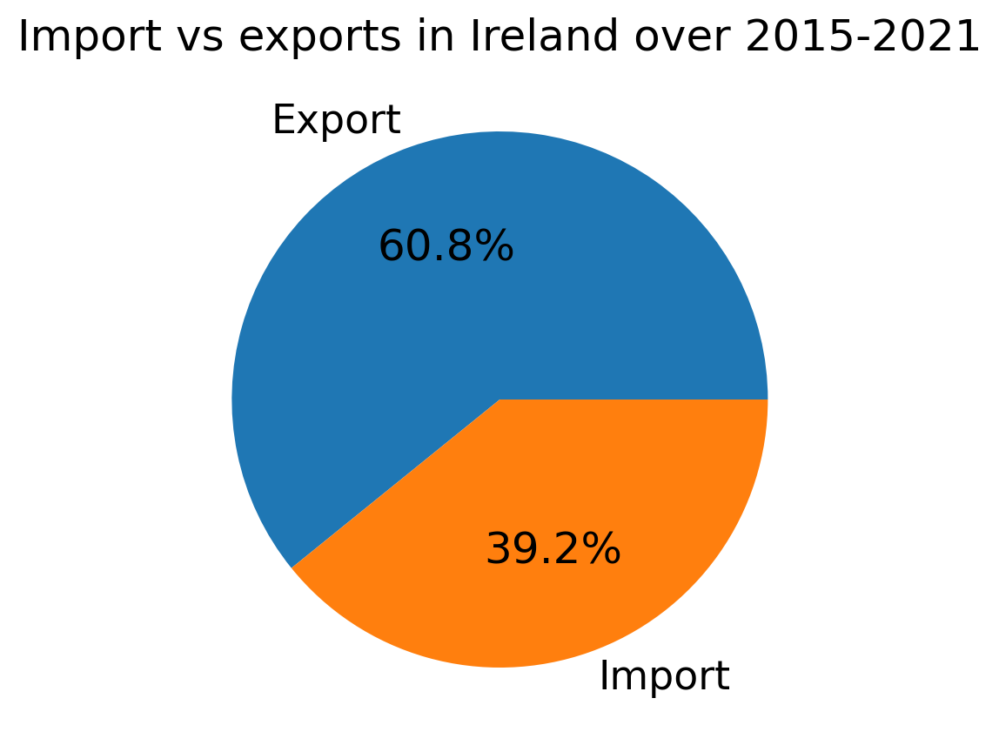

In [45]:
df_Ireland.groupby('Trade').sum().plot.pie(title='Import vs exports in Ireland over 2015-2021',
                                             y='Total Gross', figsize=(5, 5), autopct='%.1f%%', legend=False, ylabel=''); 


The pie chart shows Ireland's total external trade in crops and livestock products over 2015-2021 amounted to Euro \\$82250 million. Of this total external trade,  Euro \\$50027 million (60.8%) Were exported crops and livestock products, while Euro $32223 million (39.2) were imported crops and livestock products. 

To study the relationship between the import and export products, We filter the data frame df_Ireland into two datasets, one for import items and the other for export items in Ireland. Let us display the highest crops/livestock production imported and exported in Ireland. 

In [46]:
df_Ireland.head()

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Total Gross,Trade
0,Crops and livestock products,Ireland,Bovine Meat,2454,2508,2716,2874,2601,2660,2838,18653.84379,Export
1,Crops and livestock products,Ireland,Cereals,40,18,21,22,36,45,64,249.10032,Export
2,Crops and livestock products,Ireland,Dairy Products,1869,1868,2627,3013,3270,3314,3682,19647.23284,Export
3,Crops and livestock products,Ireland,Eggs,18,13,15,14,17,20,41,141.71600,Export
4,Crops and livestock products,Ireland,Fodder and Feeding Stuff,306,290,339,375,377,416,505,2610.96716,Export


To know the highest crops/livestock production in Ireland:
* Drop the 'Total Gross' column.
* Melt the df_Ireland to include all the Years 2015-2021 in one column 'Year'.
* Split to two datasets df_Ireland_import, df_Ireland_export one for Import and the other for export 
* Sort the dataframe df_Ireland

In [47]:
df_Ireland.drop(['Total Gross'],axis = 1, inplace = True)
df_Ireland_melted = df_Ireland.melt(id_vars=['Domain','Region','Production','Trade'], 
                                    var_name='Year', value_name='Value $M')

In [48]:
# Again we filter the data into two datasets one for import items and the other for export items in Ireland.
df_Ireland_import = df_Ireland_melted.loc[df_Ireland_melted['Trade']=='Import']
df_Ireland_export = df_Ireland_melted.loc[df_Ireland_melted['Trade']=='Export']
# df_Ireland_import.reset_index(drop= True,inplace=True)
# df_Ireland_import

In [49]:
# .sort_values() method sorts the data in descending order to display the highest crops/livestocks production
IRL_ImportedOrded = df_Ireland_import.sort_values(by=['Value $M'], ascending=False) 
IRL_ExportedOrded = df_Ireland_export.sort_values(by=['Value $M'], ascending=False) 

For clarity, we rename 'Element' column with 'Import' in df_Ireland_import and 'Export' in 'df_Ireland_export' 

In [50]:
df_Ireland_import.rename(columns = {'Trade':'Import'}, inplace = True)
df_Ireland_export.rename(columns = {'Trade':'Export'}, inplace = True)

In [51]:
# df_Ireland_melted.head() 

In [52]:
# df_Ireland_melted.info()

In [53]:
# df_Ireland_melted['Year'] = df_Ireland_melted['Year'].astype('int')

**Pie char**

Now the data is much more organised but is long when it should be wide. Looking at the IRL_Import_Inorder and IRL_Export_Inorder, the 'Item' column contains duplicated values, so we will pivot them to make a wide data frame with no repeated crops/ livestock products in the 'Item' column. [pandas.pydata.org. (n.d.). pandas.DataFrame.pivot — pandas 1.3.5 documentation. [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.pivot.html.]

In [54]:
IRL_Import = df_Ireland_import.pivot(index='Production', columns='Year', values='Value $M');
# IRL_Import.head()

In [55]:
IRL_Export= df_Ireland_export.pivot(index='Production', columns='Year', values='Value $M');
# IRL_Export.head()

<AxesSubplot: title={'center': 'Values of crops and livestock products imported by Ireland over 2015-2021'}>

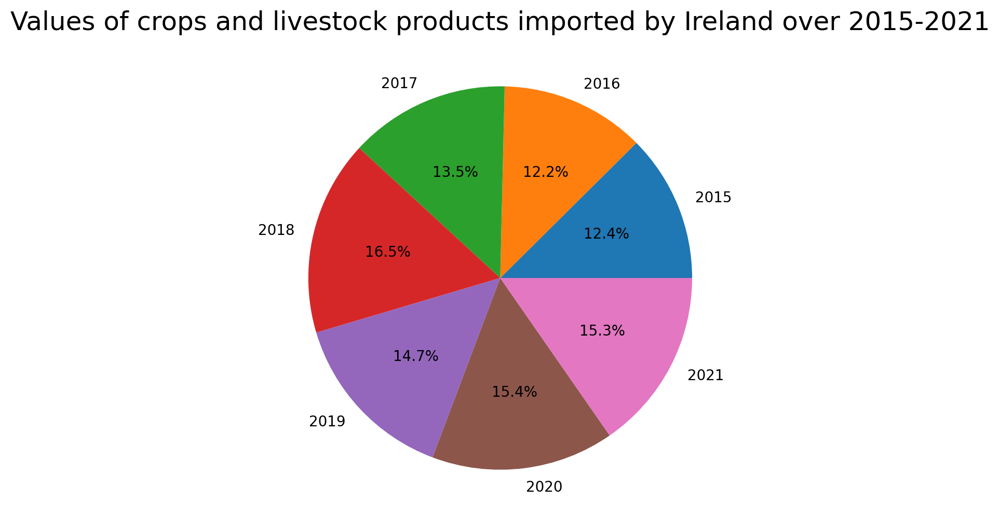

In [56]:
# Pie plot for the imported products in Ireland
ax=IRL_Import.sum(axis = 0).plot.pie(title='Values of crops and livestock products imported by Ireland over 2015-2021',
                                           legend=False, autopct='%1.1f%%',
                                           fontsize=10, figsize=(8,6),ylabel='');
ax

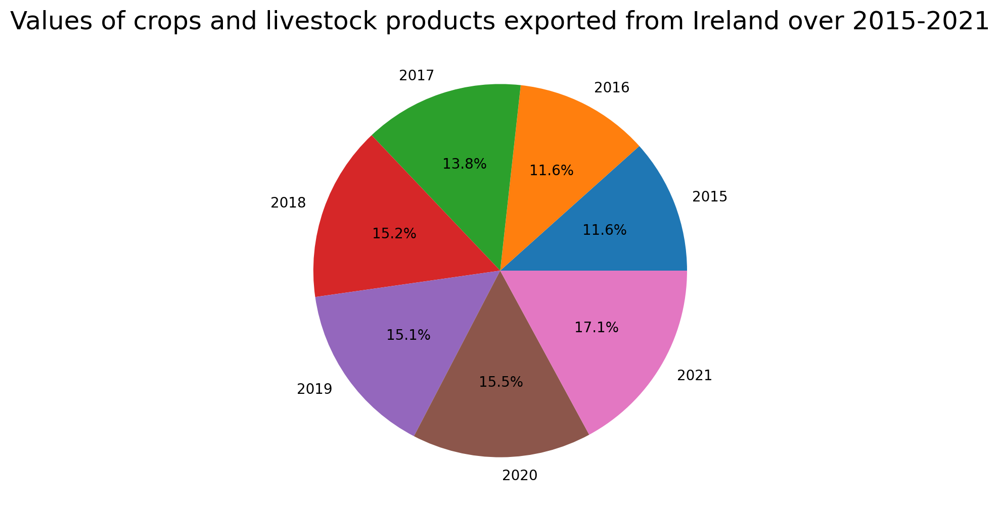

In [57]:
# Pie plot for the exported products in Ireland
ax =IRL_Export.sum(axis = 0).plot.pie(title='Values of crops and livestock products exported from Ireland over 2015-2021',
                                                  legend=False, autopct='%1.1f%%', fontsize=10, figsize=(8,6), ylabel = '') 
plt.show()

This pie chart for the imported crops and livestock products in Ireland over 2015-202 shows a gradually increased from 12.4% in 2015 to 15.3% in 2021. on the other hand,  the pie chart for export products depicts an increment rate percentage in Ireland's exported crops and livestock products over 2015-202. it was 11.6% in 2015 and was increased to 17.1% in 2021.

<br>

**Q2: What is the top agricultural production in Ireland?**

The most imported produsts in Ireland is the 'Fodder and feeding stuff' While the 'DiaryProducts' is the most livestock products exported from Ireland. That dairy products include (Butter of cow milk, Buttermilk, curdled and acidified milk, Cheese from whole cow milk, Cream, fresh, Processed cheese, Raw milk of cattle, Skim milk and whey powder, Skim milk of cows, whey(condensed), Whey(dry), Whole milk powder, Whole milk( condensed), Whole milk(evaporated), and Yoghurt( with additives)).  

Let us display the highest crops/livestock production in Ireland by sorting the datasets for df_Ireland)import and df_Ireland_export on descending order.

Top 10 crops and livestock products imported & exported by Ireland

In [58]:
# .sort_values() method sorts the data in descending order to display the highest crops/livestocks production
IRL_ImportedOrded = df_Ireland_import.sort_values(by=['Value $M'], ascending=False) 
IRL_ImportedOrded.head(10)

,Domain,Region,Production,Import,Year,Value $M
147,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Import,2021,1267
81,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Import,2018,1250
125,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Import,2020,1095
103,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Import,2019,990
123,Crops and livestock products,Ireland,Dairy Products,Import,2020,930
79,Crops and livestock products,Ireland,Dairy Products,Import,2018,888
59,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Import,2017,874
15,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Import,2015,859
101,Crops and livestock products,Ireland,Dairy Products,Import,2019,855
37,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Import,2016,816


In [59]:
# .sort_values() method sorts the data in descending order to display the highest crops/livestocks production
IRL_ExportedOrded = df_Ireland_export.sort_values(by=['Value $M'], ascending=False) 
# df_Ireland_export.reset_index(drop= True,inplace=True)
IRL_ExportedOrded.head(10)

,Domain,Region,Production,Export,Year,Value $M
134,Crops and livestock products,Ireland,Dairy Products,Export,2021,3682
112,Crops and livestock products,Ireland,Dairy Products,Export,2020,3314
90,Crops and livestock products,Ireland,Dairy Products,Export,2019,3270
68,Crops and livestock products,Ireland,Dairy Products,Export,2018,3013
66,Crops and livestock products,Ireland,Bovine Meat,Export,2018,2874
132,Crops and livestock products,Ireland,Bovine Meat,Export,2021,2838
44,Crops and livestock products,Ireland,Bovine Meat,Export,2017,2716
110,Crops and livestock products,Ireland,Bovine Meat,Export,2020,2660
46,Crops and livestock products,Ireland,Dairy Products,Export,2017,2627
88,Crops and livestock products,Ireland,Bovine Meat,Export,2019,2601


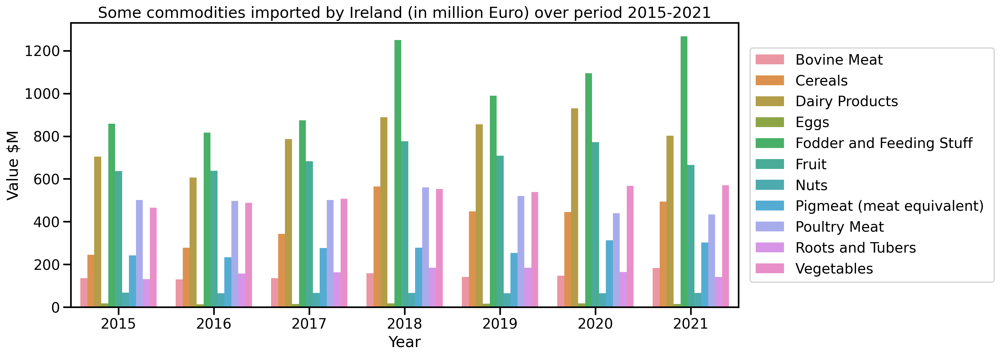

In [60]:
plt.figure(figsize=(14,6))
sns.barplot(data=df_Ireland_import, x='Year', y='Value $M',hue='Production',linewidth=2.5)
# plt.ylim([0, 900])
plt.legend(ncol=1, loc='center', bbox_to_anchor=(1.2,0.5))
plt.title('Some commodities imported by Ireland (in million Euro) over period 2015-2021')
plt.show()

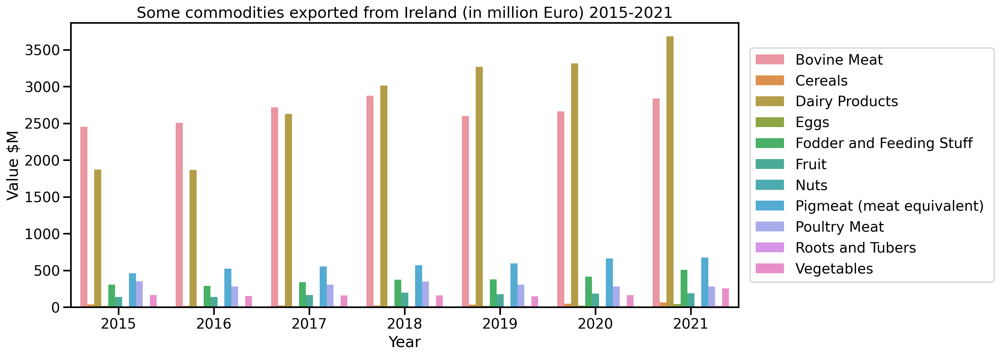

In [61]:
plt.figure(figsize=(14,6))
sns.barplot(data=df_Ireland_export, x='Year', y='Value $M',hue='Production')
plt.legend(ncol=1, loc='center', bbox_to_anchor=(1.2,0.5))
plt.title('Some commodities exported from Ireland (in million Euro) 2015-2021')           
plt.show()

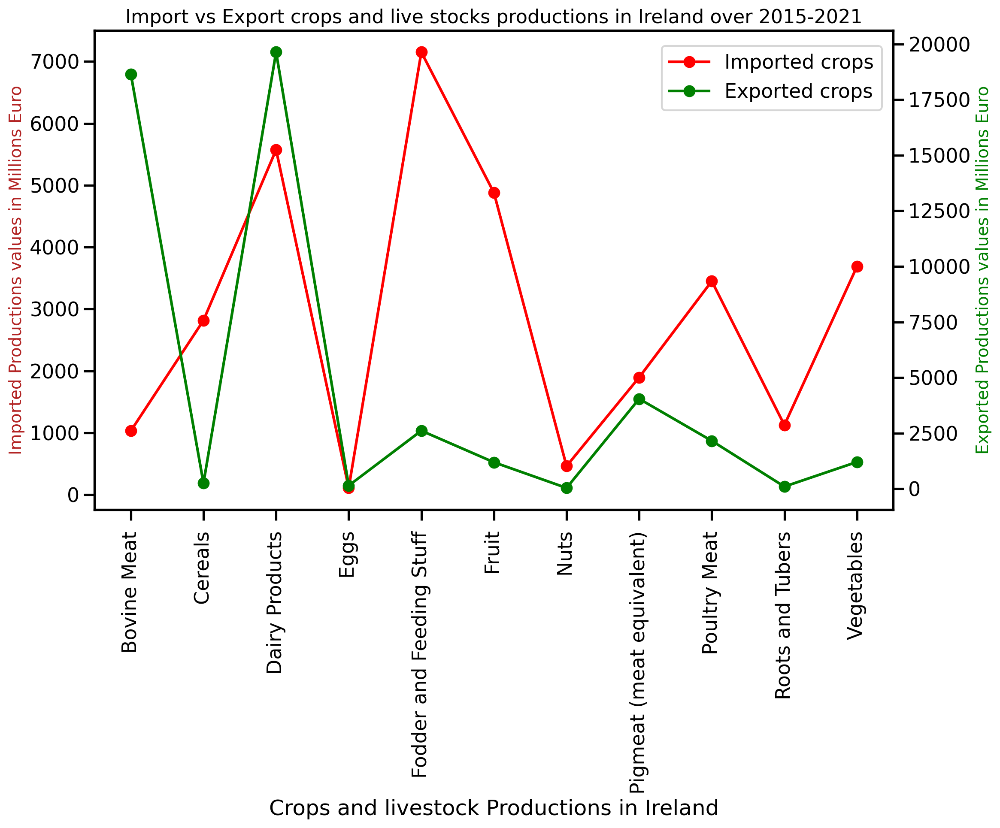

In [62]:
# plotting figures by creating axes object
# using subplots() function
fig, ax = plt.subplots(figsize = (12,10 ))

# using the twinx() for creating another
# axes object for secondary y-Axis
ax2 = ax.twinx()

# Creating the line plots
# Creating the line plots
ax.plot(IRL_Import.index,IRL_Import.sum(1),label='Imported crops',marker= 'o', color='r')
ax2.plot(IRL_Export.index, IRL_Export.sum(1), label='Exported crops', marker = 'o',color ='g')



# Place legend on the figure
fig.legend(bbox_to_anchor=(0.88, .94))

# Setting the figure title
ax.set_title('Import vs Export crops and live stocks productions in Ireland over 2015-2021',fontsize=16)

# giving labels to x and y axises
ax.set_xlabel('Crops and livestock Productions in Ireland')
ax.set_ylabel('Imported Productions values in Millions Euro',fontsize=14,color='firebrick')


# secondary y-axis label
ax2.set_ylabel('Exported Productions values in Millions Euro',fontsize=14,color='green')

# Rotate x-axis label by 75 degree
ax.tick_params(axis='x', rotation=90)
 
# defining display layout
plt.tight_layout()
 
# show plot
plt.show()

The stacked area plots were created for both import and export ordered data frames for Ireland, each row of the data frames is represented as the vertex of a polyline mark in 2D space. The area between successive polylines is filled [8].

In [63]:
# stacked area plot for df_Ireland_import data-frame 
# fig = px.area(df_Ireland_import.sort_values(by=['Value $M'],ascending=False),
#               x='Year',y='Value $M', color='Production',
#               line_group='Production', 
#               title = 'Values of some commodities imported by Ireland (in million Euro) 2015-2021'
#              )
# fig.show()

# To add to the dashboard later we use chart
px.area(df_Ireland_import.sort_values(by=['Value $M'],ascending=False),
              x='Year',y='Value $M', color='Production',
              line_group='Production', 
              title = 'Values of some commodities imported by Ireland (in million Euro) 2015-2021'
             ) 

In [64]:
# stacked area plot for df_Ireland_export data-frame 
chart = px.area(df_Ireland_import.sort_values(by=['Value $M'],ascending=False),
              x='Year', y='Value $M', color='Production',
              line_group='Production', 
              title='Values of some commodities exported from Ireland (in million Euro) over 2015-2021'
             )
# fig.show()
chart

<br>

**Histogram**

A histogram provides a visual representation of the frequency at which each value in a data collection occurs relatively unbiasedly. Histograms are plots that show the distribution of a numeric variable, grouping data into bins. The height of the bar represents the number of observations per bin.

Text(0, 0.5, '#Prices in € millions')

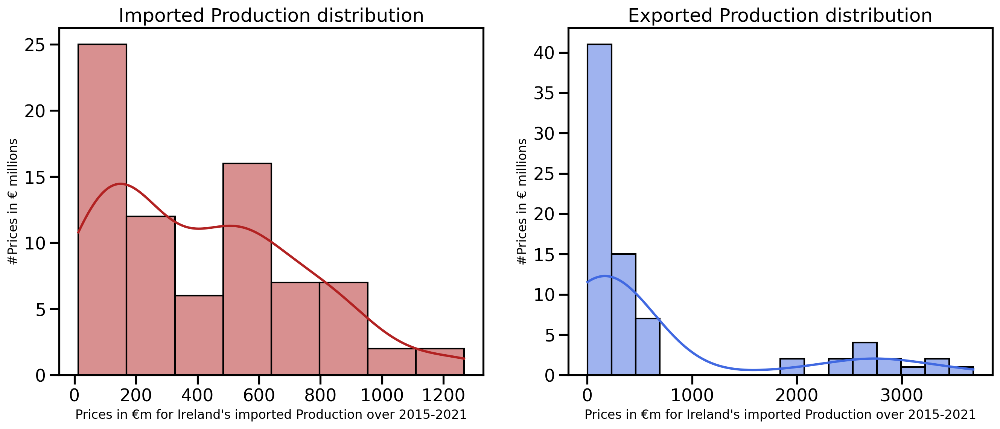

In [65]:
# set up figure & axes
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(16,6))

sns.histplot(data=df_Ireland_import, x='Value $M', kde=True, color='firebrick', ax=axes[0])
axes[0].set_title('Imported Production distribution')
axes[0].set_xlabel('Prices in €m for Ireland\'s imported Production over 2015-2021',fontsize=12)
axes[0].set_ylabel('#Prices in € millions',fontsize=12)


sns.histplot(data=df_Ireland_export, x='Value $M', kde=True, color='royalblue', ax=axes[1])
axes[1].set_title('Exported Production distribution')
axes[1].set_xlabel('Prices in €m for Ireland\'s imported Production over 2015-2021',fontsize=12)
axes[1].set_ylabel('#Prices in € millions',fontsize=12)

We can determine the number of evenly sized bins to be used in the by using the bin parameters. 

<br>

**Bar-Plot**

To create a bar plot for the import/export counts we can use plot function or seaborn 
plot() is another pandas function that requires to get the intermediate count
table from pd.crosstab() before, in dispute with seaborn, sns.catplot plot the count in one step. 

Stack Overflow. (n.d.). python - Pandas: Bar-Plot with two bars and two y-axis. [online] Available at: https://stackoverflow.com/questions/24183101/pandas-bar-plot-with-two-bars-and-two-y-axis [Accessed 6 Jan. 2023].



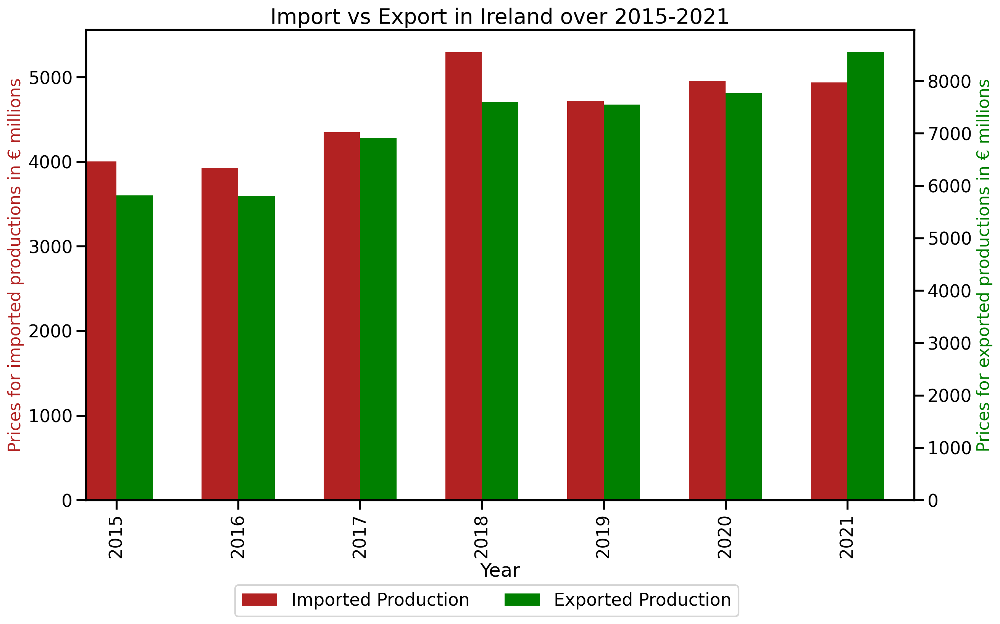

In [66]:
fig = plt.figure(figsize=(14,8))          # Create matplotlib figure
ax = fig.add_subplot(111)   # Create matplotlib axes
ax2 = ax.twinx()            # Create another axes that shares the same x-axis as ax.
width = 0.30

imp = IRL_Import.sum().plot(kind='bar',color='firebrick', ax=ax, width=width, position=1,label='Imported Production')
exp = IRL_Export.sum().plot(kind='bar',color='green',ax=ax2, width=width, position=0,label='Exported Production')

plt.title('Import vs Export in Ireland over 2015-2021',fontsize=20)
ax.set_ylabel('Prices for imported productions in € millions',fontsize=16,color='firebrick')
ax2.set_ylabel('Prices for exported productions in € millions',fontsize=16,color='green')
fig.legend(ncol=2,loc='center', bbox_to_anchor=(0.5, -0.055))
plt.show() 

The bar graph depicts that In general the Import is more than the export as we can see in 2015,2016, 2020. A small trade defecit between import and export are noticed in 2017 and 2019.
So proud to see that after the taugh time of Covid-19. Ireland exported exceeded the imported values.

In [67]:
# IRL_Import.head(2)

Stack Overflow. (n.d.). python - How to display data values in stacked horizontal bar chart in Matplotlib. [online] Available at: https://stackoverflow.com/questions/54162981/how-to-display-data-values-in-stacked-horizontal-bar-chart-in-matplotlib [Accessed 30 Dec. 2022]. 

Creating a stacked horizontal bar chart with the data values displayed on it for the crops and livestock productions in Ireland over 2015-2021.

<AxesSubplot: title={'center': 'Values of some commodities imported by Ireland (in million Euro) over the period 2015-2021'}, xlabel='Price in €m', ylabel='Year'>

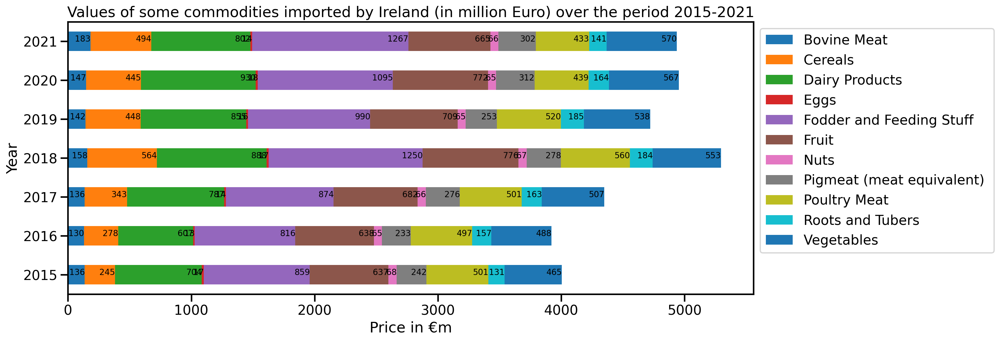

In [68]:
Item_count = df_Ireland_import.pivot(index='Year', columns='Production', values='Value $M')

ax = Item_count.plot.barh(stacked=True,figsize=(15, 6))
plt.legend(ncol=1, bbox_to_anchor=(1, 1))
plt.xlabel('Price in €m')
plt.ylabel('Year')

plt.title('Values of some commodities imported by Ireland (in million Euro) over the period 2015-2021',
          loc='center', fontsize=18)

for n, x in enumerate(Item_count.values):
    xpos = 0
    for val in x:
        xpos += val
        ax.text(xpos + 1, n, str(val), fontsize = 10,ha='right')
    xpos = 0
display(ax)    
plt.show()

<AxesSubplot: title={'center': 'Values of some commodities exported from Ireland (in million Euro) over the period 2015-2021'}, xlabel='Price in €m', ylabel='Year'>

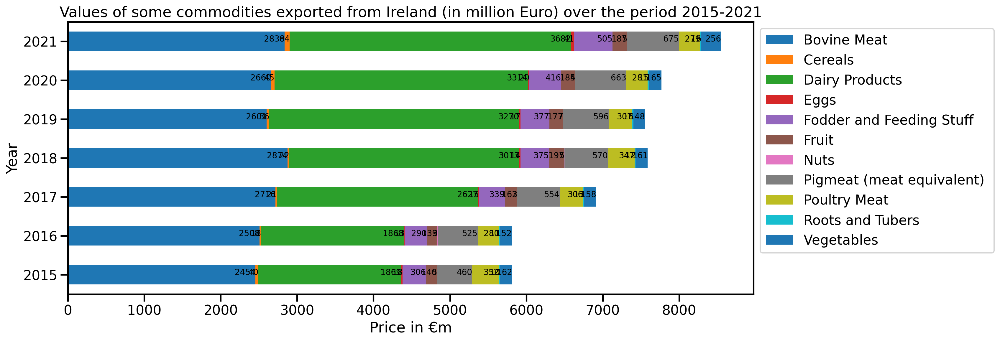

In [69]:
Item_count_export = df_Ireland_export.pivot(index='Year', columns='Production', values='Value $M')

ax = Item_count_export.plot.barh(stacked=True,figsize=(15, 6))
plt.legend(ncol=1, bbox_to_anchor=(1, 1))
plt.xlabel('Price in €m')
plt.ylabel('Year')
plt.title('Values of some commodities exported from Ireland (in million Euro) over the period 2015-2021',
          loc='center',fontsize=18)

for n, x in enumerate(Item_count_export.values):
    xpos = 0
    for val in x:
        xpos += val
        ax.text(xpos + 1, n, str(val), fontsize = 10,ha='right')
    xpos = 0
display(ax)    
plt.show()

GeeksforGeeks. (2020). How to Add a Y-Axis Label to the Secondary Y-Axis in Matplotlib? [online] Available at: https://www.geeksforgeeks.org/how-to-add-a-y-axis-label-to-the-secondary-y-axis-in-matplotlib/ [Accessed 7 Jan. 2023].



In [70]:
df_Ireland_import.head(2)

,Domain,Region,Production,Import,Year,Value $M
11,Crops and livestock products,Ireland,Bovine Meat,Import,2015,136
12,Crops and livestock products,Ireland,Cereals,Import,2015,245


<br>

**Line Plot**

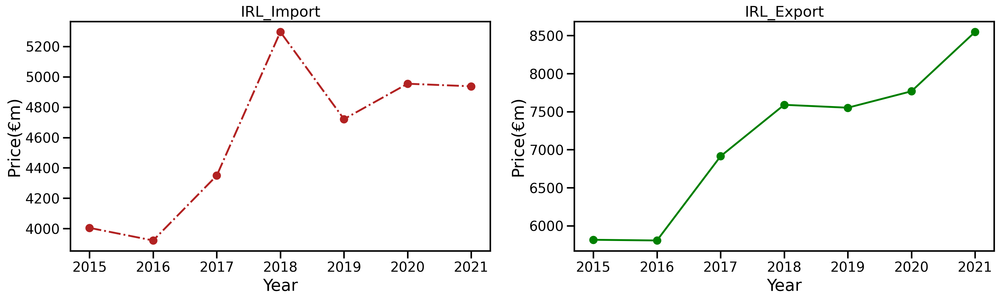

In [71]:
fig,ax =plt.subplots(1,2,figsize=(20,5))

# figure, ax = plt.xticks(rotation = 90) 

ax[0].plot(IRL_Import.sum(),c='firebrick',marker='o',ls='-.')
ax[0].set_title('IRL_Import')
ax[0].set_xlabel('Year',fontsize=20)
ax[0].set_ylabel('Price(€m)',fontsize=20)

# plt.xticks(rotation = 90)
ax[1].plot(IRL_Export.sum(),c = 'green',marker = 'o')
ax[1].set_title('IRL_Export')
ax[1].set_xlabel('Year',fontsize=20)
ax[1].set_ylabel('Price(€m)',fontsize=20)


# IRL_Import.sum().plot(kind='bar',figsize=(8,4))
# IRL_Export.sum().plot(kind='bar',figsize=(8,4))
plt.show()

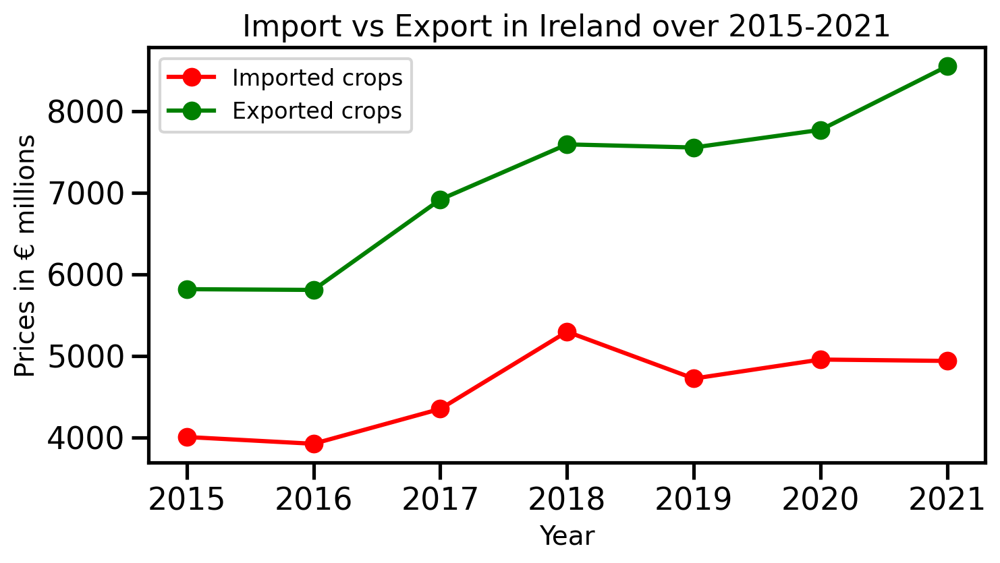

In [72]:
# Line plot for Ireland total trade over 2015-2021 
plt.figure(figsize=(8,4))
IRL_Import.sum().plot(label='Imported crops',marker= 'o', color='r')     # line plot for impoted products
IRL_Export.sum().plot(label='Exported crops',marker= 'o', color='g')     # line plot for exported products
plt.legend(fontsize=12)
plt.title('Import vs Export in Ireland over 2015-2021',fontsize=16)
plt.xlabel('Year',fontsize =14)
plt.ylabel('Prices in € millions',fontsize =14)
plt.show()

kaggle.com. (n.d.). Analysis on Indian Import Export. [online] Available at: https://www.kaggle.com/code/shubhamsinghgharsele/analysis-on-indian-import-export.



In 2018, the trade rate for imports and export increased. The imported products reached 5259 million Euro, the highest import rate from 2015-2021. at the same time, the exports became 7590 million Euro. 
In 2019 the trade rate began to decrease again. In 2021, the exported trade reached its highest rate of 8548 million Euro. 

GO-Figure! is a great tool that can use to create a visual summaries of lists of GO terms. This is useful for data analysis and comparisons of different datasets. created to add to the dashboard later

In [73]:
fig = go.Figure()
# Create and style traces
fig.add_trace(go.Scatter(x= IRL_Import.columns, y=IRL_Import.sum(), name='Import',mode='lines+markers',
                         line=dict(color='firebrick', width=4)))
fig.add_trace(go.Scatter(x= IRL_Export.columns, y=IRL_Export.sum(), name = 'Export',mode='lines+markers',
                         line=dict(color='green', width=4)))

fig.update_layout(
    title=go.layout.Title(text='Import vs Export in Ireland over 2015-2021',
                          font=dict(
                              size=20
                          )),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text='Year')),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text='Prices in € millions'))
                 )
fig.show()

<br>

## Compare export commodities for Ireland with other Europe Country

Instead of filtering the main dataframe to extract the export items only. We are going to read the export file 

In [74]:
df_export = pd.read_csv('FAOSTAT_data_Export_EU.csv')

In [75]:
df_export.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (FAO),Item,Year Code,Year,Unit,Value
0,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2015,2015,1000 US$,413436.91
1,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2016,2016,1000 US$,416309.32
2,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2017,2017,1000 US$,451317.42
3,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2018,2018,1000 US$,433067.23
4,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2019,2019,1000 US$,461881.52


In [76]:
lll = df_export.Value /1000
lll

0       413.43691
1       416.30932
2       451.31742
3       433.06723
4       461.88152
          ...    
2419    199.21434
2420    199.96462
2421    209.35856
2422    248.78600
2423    321.39627
Name: Value, Length: 2424, dtype: float64

We compare the export commodities for Ireland with all European Union countries over 2015-2021

In [77]:
# Again, we put the price in $M instead of $K
df_export.Value = df_export['Value']/1000
df_export.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (FAO),Item,Year Code,Year,Unit,Value
0,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2015,2015,1000 US$,413.43691
1,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2016,2016,1000 US$,416.30932
2,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2017,2017,1000 US$,451.31742
3,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2018,2018,1000 US$,433.06723
4,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2019,2019,1000 US$,461.88152


In [78]:
fig = px.choropleth(df_export,
                    locations='Area Code (M49)',
                    color='Value',
                    hover_name='Area',
                    animation_frame= 'Year',
                   color_continuous_scale=px.colors.sequential.Plasma)

fig.update_layout( title_text = 'europe', geo_scope = 'europe')
fig.show()

It seems the choropleth plot is not displaying any colours for any country. It may be for using the numeric code of the country 'Area Code (M49)'. Let's try to use the country abbreviations according to the International Organization for Standardization (ISO)- ISO 3166-1 alpha-3. 

Read a new CSV file containing the Europe country codes for the International Organization for Standardization (ISO)- ISO 3166-1

In [79]:
CountryCode_df = pd.read_csv('EU_CountryCodes.csv')
CountryCode_df.head()

,Country,alpha-2,alpha-3,country-code
0,Austria,AT,AUT,40
1,Belgium,BE,BEL,56
2,Bulgaria,BG,BGR,100
3,Croatia,HR,HRV,191
4,Cyprus,CY,CYP,196


We Convert the two  columns 'Country' and 'alpha-3' to a dictionary to add a new column 'alpha-3' to the data frame 'df_export' 

cmdlinetips (2021). How To Convert Two Columns from Pandas Dataframe to a Dictionary. [online] Python and R Tips. Available at: https://cmdlinetips.com/2021/04/convert-two-column-values-from-pandas-dataframe-to-a-dictionary/ [Accessed 9 Jan. 2023]. 

In [80]:
# dict() function on the zip object with two iterables gives us the dictionary we need.
# zip() function takes iterables as its argument and returns iterator.
EuCountries_abbreviations_3 = dict(zip(CountryCode_df.Country, CountryCode_df['alpha-3']))

In [81]:
# EuCountries_abbreviations_3

Now, we add a new column 'Alpha-3' to map the countries' names in the 'Area' column to their abbreviations using an area map dictionary Countries_abbreviations_3

In [82]:
df_export['Alpha-3'] = df_export['Area'].map(EuCountries_abbreviations_3)

In [83]:
df_export.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (FAO),Item,Year Code,Year,Unit,Value,Alpha-3
0,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2015,2015,1000 US$,413.43691,AUT
1,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2016,2016,1000 US$,416.30932,AUT
2,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2017,2017,1000 US$,451.31742,AUT
3,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2018,2018,1000 US$,433.06723,AUT
4,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2019,2019,1000 US$,461.88152,AUT


In [84]:
df_export_2021 = df_export.query("Year == 2021")
df_export_2021.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (FAO),Item,Year Code,Year,Unit,Value,Alpha-3
6,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2021,2021,1000 US$,592.32672,AUT
13,TCL,Crops and livestock products,40,Austria,5922,Export Value,1941,Cereal preparations total,2021,2021,1000 US$,1385.61272,AUT
20,TCL,Crops and livestock products,40,Austria,5922,Export Value,2071,Bovine Meat,2021,2021,1000 US$,589.37134,AUT
27,TCL,Crops and livestock products,40,Austria,5922,Export Value,2074,Poultry Meat,2021,2021,1000 US$,379.17957,AUT
34,TCL,Crops and livestock products,40,Austria,5922,Export Value,2073,Pigmeat (meat equivalent),2021,2021,1000 US$,915.28358,AUT


In [85]:
# choropleth plot
fig = px.choropleth(df_export,
                    locations='Alpha-3',
                    color='Value',
                    hover_name='Area',
                    animation_frame='Year',
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.update_layout( title_text = 'The crop and livestock production exported from EU countries over 2015-2021', 
                  geo_scope = 'europe' )
fig.show()
chart1 = fig


In [86]:
df_export

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (FAO),Item,Year Code,Year,Unit,Value,Alpha-3
0,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2015,2015,1000 US$,413.43691,AUT
1,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2016,2016,1000 US$,416.30932,AUT
2,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2017,2017,1000 US$,451.31742,AUT
3,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2018,2018,1000 US$,433.06723,AUT
4,TCL,Crops and livestock products,40,Austria,5922,Export Value,1944,Cereals,2019,2019,1000 US$,461.88152,AUT
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2419,TCL,Crops and livestock products,752,Sweden,5922,Export Value,1892,Fodder and Feeding Stuff,2017,2017,1000 US$,199.21434,SWE
2420,TCL,Crops and livestock products,752,Sweden,5922,Export Value,1892,Fodder and Feeding Stuff,2018,2018,1000 US$,199.96462,SWE
2421,TCL,Crops and livestock products,752,Sweden,5922,Export Value,1892,Fodder and Feeding Stuff,2019,2019,1000 US$,209.35856,SWE
2422,TCL,Crops and livestock products,752,Sweden,5922,Export Value,1892,Fodder and Feeding Stuff,2020,2020,1000 US$,248.78600,SWE


Get the top 5 countries that exported the crops and livestock production in the EU 

In [87]:
# Get the top 5 countries that exported the crops and livestock production in The EU 
Top5 = df_export.groupby('Area').sum().sort_values(by=['Value'], ascending=False) 
Top5.head()

,Area Code (M49),Element Code,Item Code (FAO),Year Code,Year,Value
Area,,,,,,
Netherlands,48048,538902,170905,183638,183638,357428.65093
Germany,25116,538902,170905,183638,183638,284083.60565
Spain,65884,538902,170905,183638,183638,234477.18214
France,22750,538902,170905,183638,183638,227848.75099
Belgium,5096,538902,170905,183638,183638,170947.12601


In [88]:
# We display a bar plot for all EU countries 
chart2 = px.bar(data_frame=df_export,
               x='Area',
               y='Value',
               title='The crop and livestock production exported from EU countries over 2015-2021',
               )
chart2

The figure shows that the Netherlands has the highest European Union export rate from 2015-2021. The Top five countries are the Netherlands, Germany, Spain, France, and Belgium. 

In [89]:
# fig = go.Figure(
#                data = go.Choropleth(locations=df_export['Alpha-3'],
#                                     z = df_export['Value'].astype(int) ,
#                                     locationmode='ISO-3',
#                                     colorbar_title='Price in $'))                             
                                
                    
# fig.update_layout(
#                  title_text = ' ',
#                   geo_scope='europe'
# )
# fig.show()

## An Interactive Dashboard with Panel

panel.holoviz.org. (n.d.). Overview — Panel v0.14.1. [online] Available at: https://panel.holoviz.org/.



**What iS Panel?**
Panel is an open source python library that can be used to create interactive web apps and dashboards. 

In [90]:
import panel as pn
pn.extension('tabulator')       # Creating interactive table
import hvplot.pandas
# pn.interact(find_outliers)

In [91]:
df1 = df_Ireland_melted.copy() 

In [92]:
df1.head()

,Domain,Region,Production,Trade,Year,Value $M
0,Crops and livestock products,Ireland,Bovine Meat,Export,2015,2454
1,Crops and livestock products,Ireland,Cereals,Export,2015,40
2,Crops and livestock products,Ireland,Dairy Products,Export,2015,1869
3,Crops and livestock products,Ireland,Eggs,Export,2015,18
4,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Export,2015,306


In [93]:
IRL_Import_df1 = df1.loc[df1['Trade']=='Import']
IRL_Export_df1= df1.loc[df1['Trade']=='Export']

In [94]:
IRL_Import_df1.head()

,Domain,Region,Production,Trade,Year,Value $M
11,Crops and livestock products,Ireland,Bovine Meat,Import,2015,136
12,Crops and livestock products,Ireland,Cereals,Import,2015,245
13,Crops and livestock products,Ireland,Dairy Products,Import,2015,704
14,Crops and livestock products,Ireland,Eggs,Import,2015,17
15,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Import,2015,859


We need to merge the import and export have a dataset ??????????/

In [95]:
IRL_Import_df1.drop('Trade',axis = 1, inplace = True)
IRL_Import_df1.rename(columns = {'Value $M':'Import'}, inplace = True)

IRL_Export_df1.drop('Trade',axis = 1, inplace = True)
IRL_Export_df1.rename(columns = {'Value $M':'Export'}, inplace = True)

In [96]:
All_Ireland = pd.merge(IRL_Import_df1,IRL_Export_df1, on=['Domain','Production','Year'])

In [97]:
# All_Ireland.info()

In [98]:
# We change the data type of the year to int as I got an error when calculating the totalGross_Pipeline 
All_Ireland['Year'] = All_Ireland['Year'].astype(int) 

In [99]:
#  Make dataframe Interactive
# df_export_melted = df_melted.loc[df_melted.Trade=='Export']
idf = All_Ireland.interactive()

In [100]:
idf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77 entries, 0 to 76
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Domain      77 non-null     object
 1   Region_x    77 non-null     object
 2   Production  77 non-null     object
 3   Year        77 non-null     int32 
 4   Import      77 non-null     int64 
 5   Region_y    77 non-null     object
 6   Export      77 non-null     int64 
dtypes: int32(1), int64(2), object(4)
memory usage: 4.5+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 77 entries, 0 to 76
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Domain      77 non-null     object
 1   Region_x    77 non-null     object
 2   Production  77 non-null     object
 3   Year        77 non-null     int32 
 4   Import      77 non-null     int64 
 5   Region_y    77 non-null     object
 6   Export      77 non-null     int64 
dtypes: int32(1)

 **Define Panel Widget**

Using a slider, the IntSlider widget enables selecting an integer value within predefined bounds.

panel.holoviz.org. (n.d.). IntSlider — Panel v0.14.2. [online] Available at: https://panel.holoviz.org/reference/widgets/IntSlider.html.



In [101]:
year_slider = pn.widgets.IntSlider(name='Year slider',
                                   start= 2015, end =2021, step=1)
year_slider

IntSlider(end=2021, name='Year slider', start=2015, value=2015)

The RadioButtonGroup widget is used here to create toggle buttons to select values from a list or dictionary.



panel.holoviz.org. (n.d.). RadioButtonGroup — Panel v0.14.2. [online] Available at: https://panel.holoviz.org/reference/widgets/RadioButtonGroup.html

In [102]:
# Radio button for the total Gross of the export
# options parameter: is a list or dictionary of options to select from

y_Trade = pn.widgets.RadioButtonGroup(
#     name = 'Total Gross for export production from Ireland',
    options=['Import','Export'],
    button_type = 'success'
)
y_Trade

RadioButtonGroup(button_type='success', options=['Import', 'Export'], value='Import')

In [103]:
All_Ireland

,Domain,Region_x,Production,Year,Import,Region_y,Export
0,Crops and livestock products,Ireland,Bovine Meat,2015,136,Ireland,2454
1,Crops and livestock products,Ireland,Cereals,2015,245,Ireland,40
2,Crops and livestock products,Ireland,Dairy Products,2015,704,Ireland,1869
3,Crops and livestock products,Ireland,Eggs,2015,17,Ireland,18
4,Crops and livestock products,Ireland,Fodder and Feeding Stuff,2015,859,Ireland,306
...,...,...,...,...,...,...,...
72,Crops and livestock products,Ireland,Nuts,2021,66,Ireland,5
73,Crops and livestock products,Ireland,Pigmeat (meat equivalent),2021,302,Ireland,675
74,Crops and livestock products,Ireland,Poultry Meat,2021,433,Ireland,279
75,Crops and livestock products,Ireland,Roots and Tubers,2021,141,Ireland,16


Now, We need to connect our data pipeline with our widgets 

In [104]:
All_Ireland.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77 entries, 0 to 76
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Domain      77 non-null     object
 1   Region_x    77 non-null     object
 2   Production  77 non-null     object
 3   Year        77 non-null     int32 
 4   Import      77 non-null     int64 
 5   Region_y    77 non-null     object
 6   Export      77 non-null     int64 
dtypes: int32(1), int64(2), object(4)
memory usage: 4.5+ KB


In [105]:
trade_Pipeline = (
    idf[
        (idf.Year <= year_slider)
    ]
    .groupby(['Production','Year'])[y_Trade].mean()
    .to_frame()
    .reset_index()
    .sort_values(by='Year')
    .reset_index(drop=True)
) 

In [106]:
trade_Pipeline

In [107]:
Productions_plot = trade_Pipeline.hvplot(x = 'Year',
                                         by='Production',
                                         y=y_Trade,
                                         line_width=2,
                                         width = 900, 
                                         height = 400,
                                         title='Ireland crops and livestock productions Trade')
Productions_plot

To create an interactive table for Ireland trade over 2015-2021. We can use the Tabulator widget to display and add the pandas dataframe.  

In [108]:
Ireland_table = trade_Pipeline.pipe(pn.widgets.Tabulator, pagination='remote', page_size = 10, sizing_mode='stretch_width') 
Ireland_table

**Creating Dashboard**

In [109]:
#Layout using Template
template = pn.template.FastListTemplate(
    title='Ireland crops and livestock productions Trade over 2015-2021 dashboard', 
    
    sidebar=[pn.pane.Markdown("# Ireland Agriculture DataAnalysis"), 
              pn.pane.Markdown("#### The agricultural sector can be considered the backbone of each country.\
                              Digital Agriculture (DA) spread in the last decade due to applying Information ,\
                              and Communication Technologies (ICT) in agriculture. DA established novel procedures,\
                              for farming to guarantee crop increment, efficiency, and control while protecting the environment."), 
              pn.pane.PNG('image.png', sizing_mode='scale_both'),
              pn.pane.Markdown("## Settings"),  
              year_slider],
    
      main=[pn.Row(pn.Column(chart2), pn.Column(chart1)),
            
          pn.Row(pn.Column(y_Trade,Ireland_table.panel(width=500)),                    
                                     pn.Column(y_Trade,
                           Productions_plot.panel(width=700,lenght=300)))]  
)   
template.show()  


Launching server at http://localhost:53602


**Feature Engineering**

The Ireland import and export the crops and livestock production dataset contains categorical and numeric features. Before building a machine learning model, we should make preprocessing steps on the data. The regression model can be fed with numeric features only to apply. In this case, the dummy variables will replace the categorical features.

In [110]:
df_Ireland_melted.head()

,Domain,Region,Production,Trade,Year,Value $M
0,Crops and livestock products,Ireland,Bovine Meat,Export,2015,2454
1,Crops and livestock products,Ireland,Cereals,Export,2015,40
2,Crops and livestock products,Ireland,Dairy Products,Export,2015,1869
3,Crops and livestock products,Ireland,Eggs,Export,2015,18
4,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Export,2015,306


In [111]:
# Drop irrelevant columns:
df_Ireland_melted.drop(columns=['Domain'],axis=1,inplace=True)

**1- conversion of categorical variables to numerical variables:**
    

Scikit-learn.org. (2019). sklearn.preprocessing.OneHotEncoder — scikit-learn 0.22 documentation. [online] Available at: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html.

Srinidhi, S. (2020). Label Encoder vs. One Hot Encoder in Machine Learning. [online] Medium. Available at: https://contactsunny.medium.com/label-encoder-vs-one-hot-encoder-in-machine-learning-3fc273365621.





We have many encodings to convert the categorical data into numeric data:

* **Label Encoding:** The categorical values in the column will be encoded with a value between zero and the number of classes-1.<br>

* **Ordinal Encoding(integer encoding):** The categorical values should be in an ordinal relationship to apply ordinal encoding. The ordinal encoding converts each unique category value into an integer value starting from zero to the number of classes-1

* **One Hot Encoding & Dummy Variable Encoding:** It splits the categorical column when no ordinal relationship exists into multiple columns(n), where n is the number of columns equal to the unique values in the categorical column. Each column contains binary values to indicate the presence or absence of a category with a value of 1 or 0, respectively.


We will build ML models for both classification and prediction. The scikit documentation advises using a label encoding with the target variable. We will use label encoding to map the target values in the 'Trade' columns. Moreover, the one-hot encoding with the feature 'Production' to avoid the ML model misunderstandings during the training stage. Scikit-Learn's DictVectorizer method will encode our categorical columns to numeric.

In [112]:
# Map the categorical column'Trade' into numeric valus
from sklearn import preprocessing
# define label encoding
le = preprocessing.LabelEncoder()
# transform the target column 'Trade'
df_Ireland_melted['Trade'] = le.fit_transform(df_Ireland_melted['Trade'])
df_Ireland_melted.head() 

,Region,Production,Trade,Year,Value $M
0,Ireland,Bovine Meat,0,2015,2454
1,Ireland,Cereals,0,2015,40
2,Ireland,Dairy Products,0,2015,1869
3,Ireland,Eggs,0,2015,18
4,Ireland,Fodder and Feeding Stuff,0,2015,306


In [113]:
# Categorical Data in the 'Production' column Conversion to numeric values
df_Ireland_melted = pd.get_dummies(df_Ireland_melted,columns=['Production']) 

In [114]:
df_Ireland_melted.head()

,Region,Trade,Year,Value $M,Production_Bovine Meat,Production_Cereals,Production_Dairy Products,Production_Eggs,Production_Fodder and Feeding Stuff,Production_Fruit,Production_Nuts,Production_Pigmeat (meat equivalent),Production_Poultry Meat,Production_Roots and Tubers,Production_Vegetables
0,Ireland,0,2015,2454,1,0,0,0,0,0,0,0,0,0,0
1,Ireland,0,2015,40,0,1,0,0,0,0,0,0,0,0,0
2,Ireland,0,2015,1869,0,0,1,0,0,0,0,0,0,0,0
3,Ireland,0,2015,18,0,0,0,1,0,0,0,0,0,0,0
4,Ireland,0,2015,306,0,0,0,0,1,0,0,0,0,0,0


In [115]:
df_Ireland_melted.describe()

,Trade,Value $M,Production_Bovine Meat,Production_Cereals,Production_Dairy Products,Production_Eggs,Production_Fodder and Feeding Stuff,Production_Fruit,Production_Nuts,Production_Pigmeat (meat equivalent),Production_Poultry Meat,Production_Roots and Tubers,Production_Vegetables
count,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000
mean,0.500000,533.623377,0.090909,0.090909,0.090909,0.090909,0.090909,0.090909,0.090909,0.090909,0.090909,0.090909,0.090909
std,0.501631,766.445220,0.288418,0.288418,0.288418,0.288418,0.288418,0.288418,0.288418,0.288418,0.288418,0.288418,0.288418
min,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,66.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.500000,278.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,570.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,3682.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


**Scaling**

The minimum for 'Value $M' is 3 while the maximum is 3680 million Euro. So the crop and livestock production trade price in the 'Value' column must scale before building a ML model. 

The most popular concepts to rescale a numeric data are:<br>
* **Normalization:** All the numeric features rescaled to the range between [0-1] using the formula: 
                                X_norm=  (x-x_min)/(x_max- x_min )<br>
 
* **Standardization:** Standardization is transforming the numeric feature with Gaussian distribution to standard normal distribution by subtracting all values from the mean value (μ) and then dividing by the standard deviation value (σ): <br> <center>X_stand=  (x-μ)/( σ).

<font color='red'>We will scale the 'Value $M' column later in Machine Learning Section.</font>


In [116]:
# For Statistic Section we will melt the main dataframe df
# Melt the main dataframe
df_melted = df.melt(id_vars=['Domain','Region','Production','Total Gross','Trade'], var_name='Year', value_name='Value')
df_melted.drop(['Total Gross'],axis = 1, inplace = True)
df_melted.head() 

,Domain,Region,Production,Trade,Year,Value
0,Crops and livestock products,Austria,Bovine Meat,Export,2015,543
1,Crops and livestock products,Austria,Cereals,Export,2015,413
2,Crops and livestock products,Austria,Dairy Products,Export,2015,1219
3,Crops and livestock products,Austria,Eggs,Export,2015,22
4,Crops and livestock products,Austria,Fodder and Feeding Stuff,Export,2015,756


<br><br><br>

# Machine Learning

We will apply the machine learning algorithms to the dataset for Ireland only. We will use the classifications algorithms 
to classify Ireland's crops and livestock productions according to the prices from 2015-2021 into binary classes, import and export.

Also, We apply different regression algorithms to forecast the export trade prices of various crops and livestock productions in the coming five years in Ireland.


In [117]:
# Import scikit-learn packages and libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier 
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.metrics import confusion_matrix, classification_report      # import library for confusion matrix
from sklearn.model_selection import cross_val_score                      # cross validation library
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import (StratifiedKFold, learning_curve)
from statsmodels.tools.eval_measures import mse, rmse
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.svm import SVC
from sklearn import tree
from sklearn.model_selection import (GridSearchCV, cross_val_predict, StratifiedKFold, learning_curve)
from sklearn.tree import DecisionTreeRegressor

In [118]:
df_Ireland_melted.head()

,Region,Trade,Year,Value $M,Production_Bovine Meat,Production_Cereals,Production_Dairy Products,Production_Eggs,Production_Fodder and Feeding Stuff,Production_Fruit,Production_Nuts,Production_Pigmeat (meat equivalent),Production_Poultry Meat,Production_Roots and Tubers,Production_Vegetables
0,Ireland,0,2015,2454,1,0,0,0,0,0,0,0,0,0,0
1,Ireland,0,2015,40,0,1,0,0,0,0,0,0,0,0,0
2,Ireland,0,2015,1869,0,0,1,0,0,0,0,0,0,0,0
3,Ireland,0,2015,18,0,0,0,1,0,0,0,0,0,0,0
4,Ireland,0,2015,306,0,0,0,0,1,0,0,0,0,0,0


Check the dataset if it balanced or not?

Text(0.5, 1.0, 'Number of Export_0 vs Import_1')

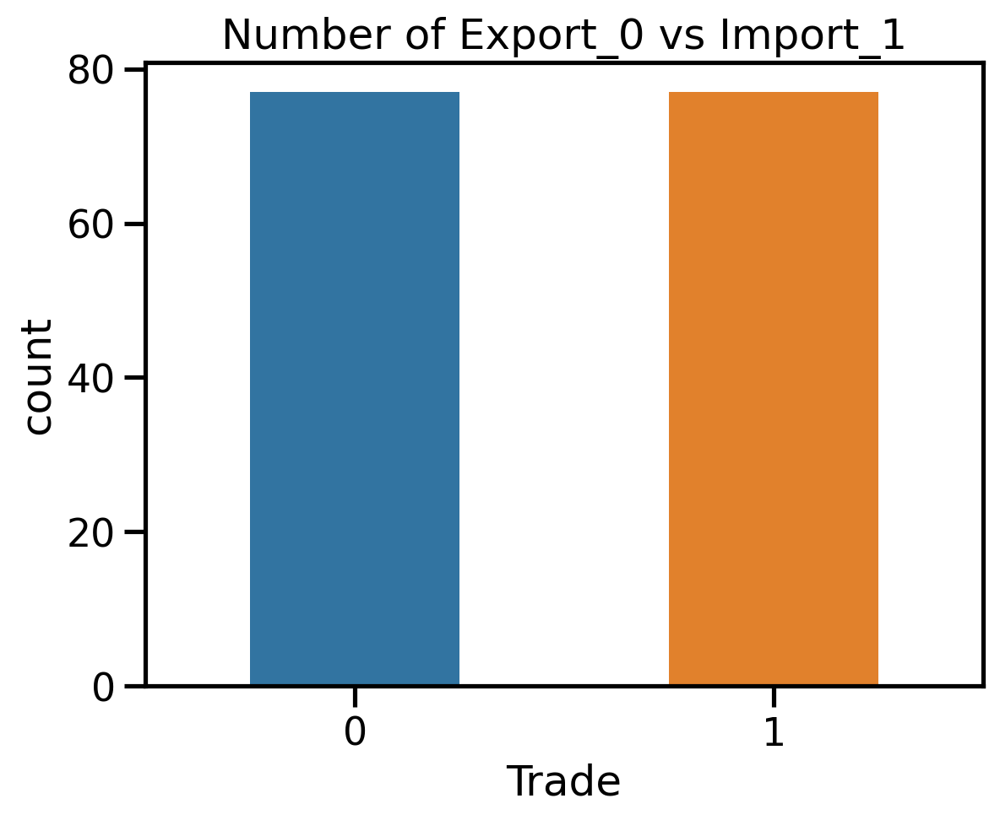

In [119]:
# visualizing the 'Trade' column >>> 'Export':0 & 'Import':1
sns.countplot(x='Trade',data = df_Ireland_melted,width=0.5)
plt.title('Number of Export_0 vs Import_1') 

Great, the figure depicts that we have a balanced dataset. 

In [120]:

df_Ireland_melted.head()

,Region,Trade,Year,Value $M,Production_Bovine Meat,Production_Cereals,Production_Dairy Products,Production_Eggs,Production_Fodder and Feeding Stuff,Production_Fruit,Production_Nuts,Production_Pigmeat (meat equivalent),Production_Poultry Meat,Production_Roots and Tubers,Production_Vegetables
0,Ireland,0,2015,2454,1,0,0,0,0,0,0,0,0,0,0
1,Ireland,0,2015,40,0,1,0,0,0,0,0,0,0,0,0
2,Ireland,0,2015,1869,0,0,1,0,0,0,0,0,0,0,0
3,Ireland,0,2015,18,0,0,0,1,0,0,0,0,0,0,0
4,Ireland,0,2015,306,0,0,0,0,1,0,0,0,0,0,0


In [121]:
# Drop Region column as it is Ireland only
df_Ireland_melted.drop(columns=['Region'],axis=1,inplace=True)

Determine X & y

In [122]:
X = df_Ireland_melted.drop(columns='Trade',axis=1).values     # features columns from 2015 to the Total Gross
y = df_Ireland_melted.Trade.values                                  # Target column

In [123]:
X.shape, y.shape

((154, 13), (154,))

The dataset will be split to two datasets, the training dataset and test dataset. The data is usually tend to be split inequality because training the model usually requires as much data-points as possible.The common splits are 70/30 or 80/20 for train/test.

The training dataset is the intial dataset used to train ML algorithm to learn and produce right predictions. (70% of dataset is training dataset)The test dataset, however, is used to assess how well ML algorithm is trained with the training dataset. 

kaggle.com. (n.d.). Crop Yield Prediction. [online] Available at: https://www.kaggle.com/code/aviraljain58/crop-yield-prediction 


In [124]:
# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [125]:
df_Ireland_melted.shape

(154, 14)

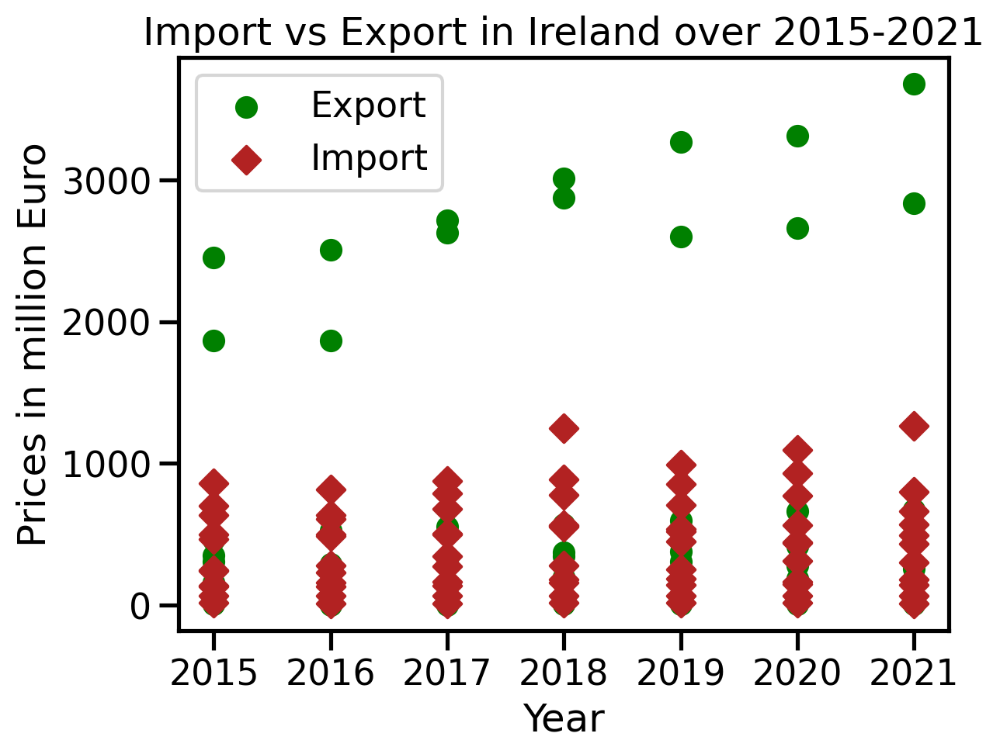

In [126]:
# plt.scatter(df_Ireland_import['Value'],df_Ireland_import['Value'])
plt.scatter(df_Ireland_melted['Year'][(df_Ireland_melted.Trade == 0)],
            df_Ireland_melted['Value $M'][(df_Ireland_melted.Trade == 0)], 
            label = 'Export', color = 'green', marker='o')

plt.scatter(df_Ireland_melted['Year'][(df_Ireland_melted.Trade == 1)]
            ,df_Ireland_melted['Value $M'][(df_Ireland_melted.Trade == 1)], 
            label = 'Import',color='firebrick',marker='D')

plt.title('Import vs Export in Ireland over 2015-2021')
plt.xlabel('Year')
plt.ylabel('Prices in million Euro')
plt.legend()
plt.show() 

In [127]:
# df_Ireland_melted['Value'][(df_Ireland_melted.Trade == 0)].plot.scatter(x='index',y='Value')

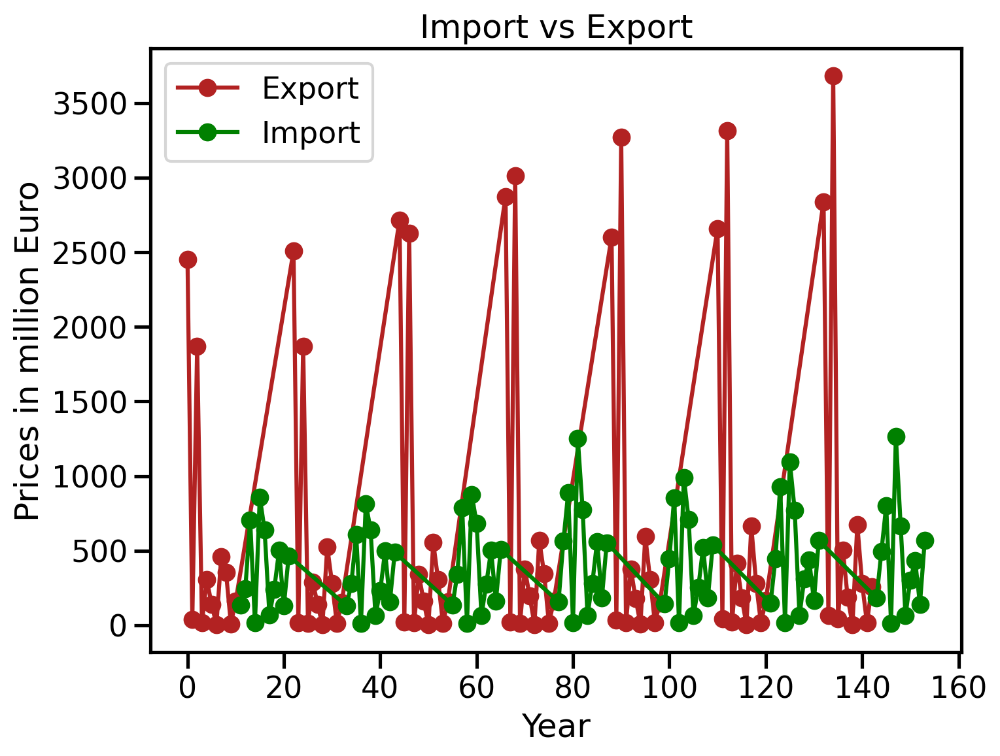

In [128]:
plt.figure(figsize=(8,6))
df_Ireland_melted['Value $M'][(df_Ireland_melted.Trade == 0)].plot(label='Export',marker= 'o', color='firebrick')     # line plot for impoted products
df_Ireland_melted['Value $M'][(df_Ireland_melted.Trade == 1)].plot(label='Import',marker= 'o', color='green')

plt.title('Import vs Export')
plt.xlabel('Year')
plt.ylabel('Prices in million Euro')
plt.legend()
plt.show() 

In [129]:
# Scaling the numeric values of the data
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [130]:
# Display the X_train & X_test
X_train.shape, X_test.shape

((123, 13), (31, 13))

### Classifications:

**K-Nearest Neighbor Classifier:<br>
==========================**

An Informal kNN Algorithm
The kNN algorithm can be summarized in the following simple steps:

1) Determine k (the selection of k depends on your data and project requirements; there is no magic formula for k).

2) Calculate the distances between the new input and all the training data (as with k, the selection of a distance function also depends on the type of data).

3) Sort the distance and determine the k nearest neighbors based on the kth minimum distance.

4) Gather the categories of those neighbors.

5) Determine the category based on majority vote.

In order to decide the best value for hyperparameter k (number of neighbors), We need to train and test your model on 10 different k values and finally use the one that gives the best results.
Let's initialize a variable neighbors(k) which will have values ranging from 1-9 and two numpy zero matrices namely train_accuracy and test_accuracy each for training and testing accuracy.
We need them later to plot a graph to choose the best neighbor value.

In [131]:
neighbors = np.arange(1, 11)                  # number of neighbors
train_accuracy = np.zeros(len(neighbors))    # Declare and initialise the matrix
test_accuracy = np.zeros(len(neighbors))     # Declare and initialise the matrix

In [132]:
for i,k in enumerate(neighbors):                          # for loop that checks the model for neighbor values 1, 2, 3, ..., 9
    knn = KNeighborsClassifier(n_neighbors = k)           # Initialise an object knn using KNeighborsClassifier method

    #Fit the model
    knn.fit(X_train, y_train)                      # Call fit method to implement the ML KNeighborsClassifier model

    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train, y_train)   # Save the score value in the train_accuracy array

    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test, y_test)      # Save the score value in the train_accuracy array

In [133]:
print(f'train_accuracy is: {train_accuracy*100}\n')
print(f'test_accuracy is: {test_accuracy*100}')

train_accuracy is: [99.18699187 72.35772358 92.68292683 76.42276423 77.23577236 70.73170732
 78.86178862 65.85365854 79.67479675 57.72357724]

test_accuracy is: [54.83870968 64.51612903 54.83870968 54.83870968 48.38709677 54.83870968
 61.29032258 54.83870968 61.29032258 41.93548387]


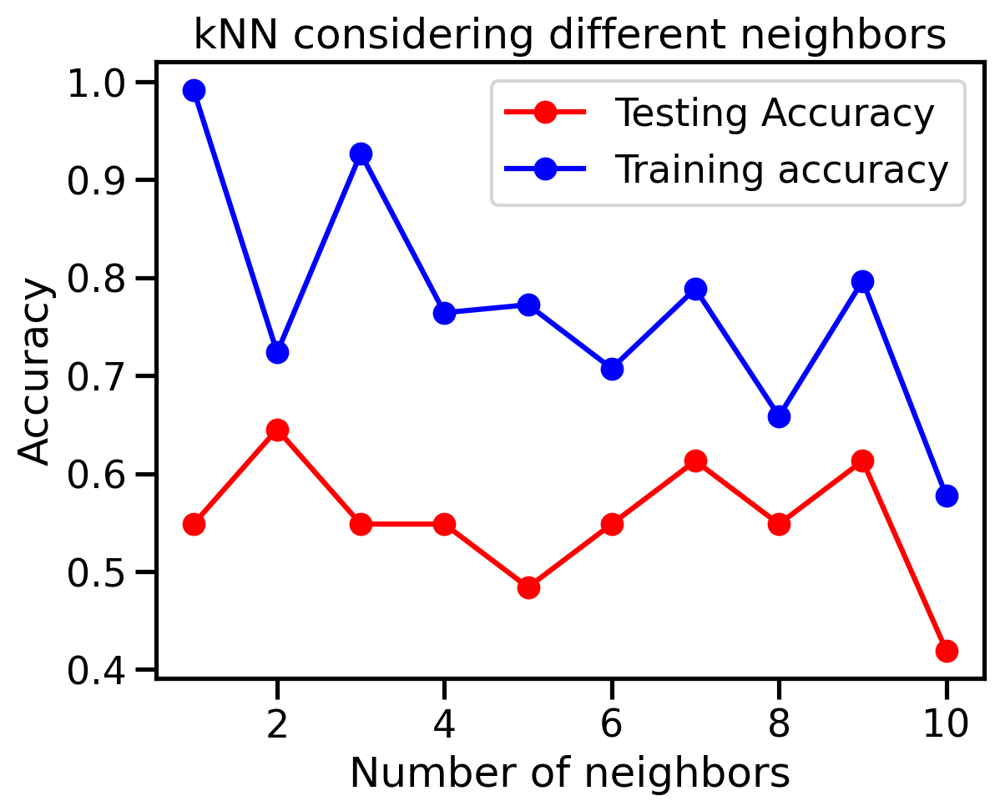

In [134]:
# Visualise the accuracy based on the number of neighbors
plt.title('kNN considering different neighbors')
plt.plot(neighbors, test_accuracy,'ro-',label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy,'bo-', label = 'Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [135]:
# Declare and initialise kNN classifier with 9 neighbors
kNN_cl = KNeighborsClassifier(n_neighbors = 2)

# Call fit() method to train the model
kNN_cl.fit(X_train, y_train)

# Calculate r2 score
print('Train Accuracy',kNN_cl.score(X_train,y_train))
print("Test Accuracy",kNN_cl.score(X_test, y_test)) 

Train Accuracy 0.7235772357723578
Test Accuracy 0.6451612903225806


In [136]:
# kNN Parameters
pprint.pprint(kNN_cl.get_params())

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 2,
 'p': 2,
 'weights': 'uniform'}


              precision    recall  f1-score   support

           0       0.56      1.00      0.72        14
           1       1.00      0.35      0.52        17

    accuracy                           0.65        31
   macro avg       0.78      0.68      0.62        31
weighted avg       0.80      0.65      0.61        31



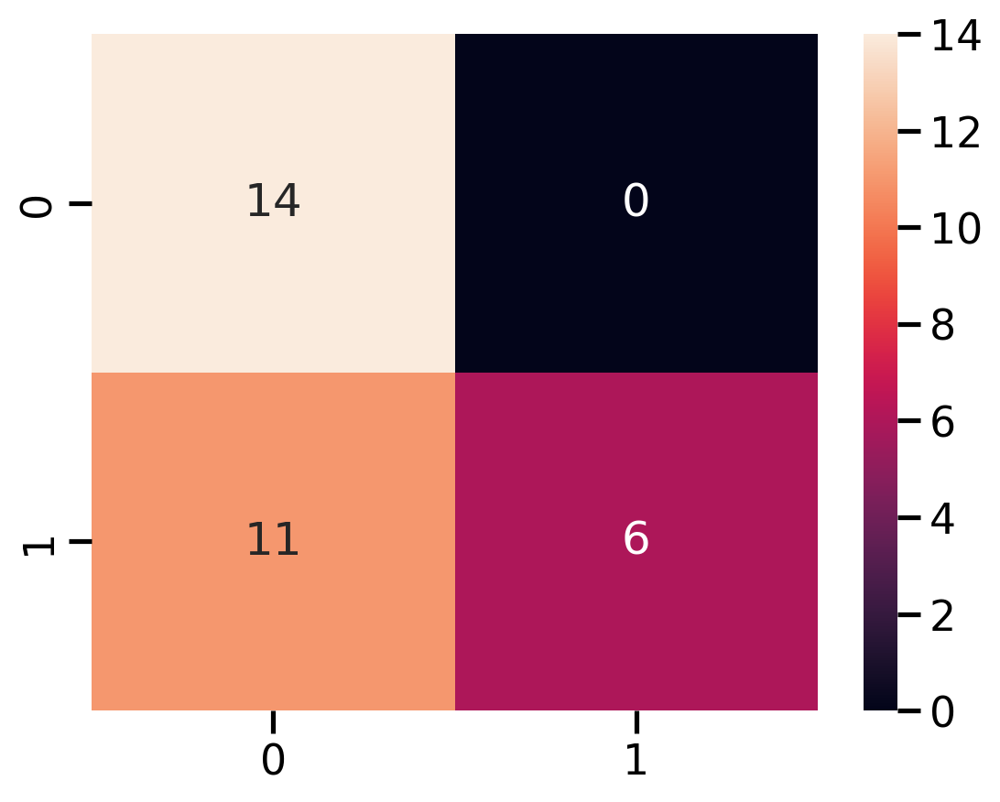

In [137]:
# Predict the results
y_pred = kNN_cl.predict(X_test)

# confusion matrix&report
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm,annot=True);
print(classification_report(y_test,y_pred)) 

In [138]:
# Print the confusion matrix
print(cm)

[[14  0]
 [11  6]]


**Cross Validation:**
<br>
K Fold Cross Validation We essentially perform holdout cross-validation multiple times in k-fold cross-validation. Therefore, we divide the dataset into k equal-sized samples for k-fold cross-validation. The remaining k1 subsamples are utilized as training data, and just one subsample of these many k subsamples is used as validation data for testing the model. The cross-validation procedure is then carried out k times, using the validation data from each of the k subsamples exactly once each time. Then, an estimation can be created by averaging the k results.

A visual representation of 5-fold cross-validation (k=5) is provided in the following screenshot:

**Use of Cross Validation with KNN:**

In [139]:
scores=cross_val_score(knn, X,y,cv=10,scoring='accuracy')
print(scores,'\n',scores.mean())                          # The scores is a list for cross validation(cv=10) 

[0.6875     0.875      0.75       0.75       0.86666667 0.8
 0.8        0.66666667 0.73333333 0.66666667] 
 0.7595833333333334


Applying the cross validation on KNN improve the model performance as the mean accuracy with cross validation = 10 is 75.9%

<br>

**DecisionTree:<br>
============**


We start training and testing our model with different max depth values, We use the max_depth value which gives best result to visualize the decision tree.

In [140]:
X = df_Ireland_melted.drop(columns='Trade',axis=1).values     # features columns from 2015 to the Total Gross
y = df_Ireland_melted.Trade.values                                  # Target column

# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)
# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

# Scaling the numeric values of the data
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

Accuracy: [66.66666666666666, 79.48717948717949, 82.05128205128204, 89.74358974358975, 89.74358974358975, 89.74358974358975, 89.74358974358975]


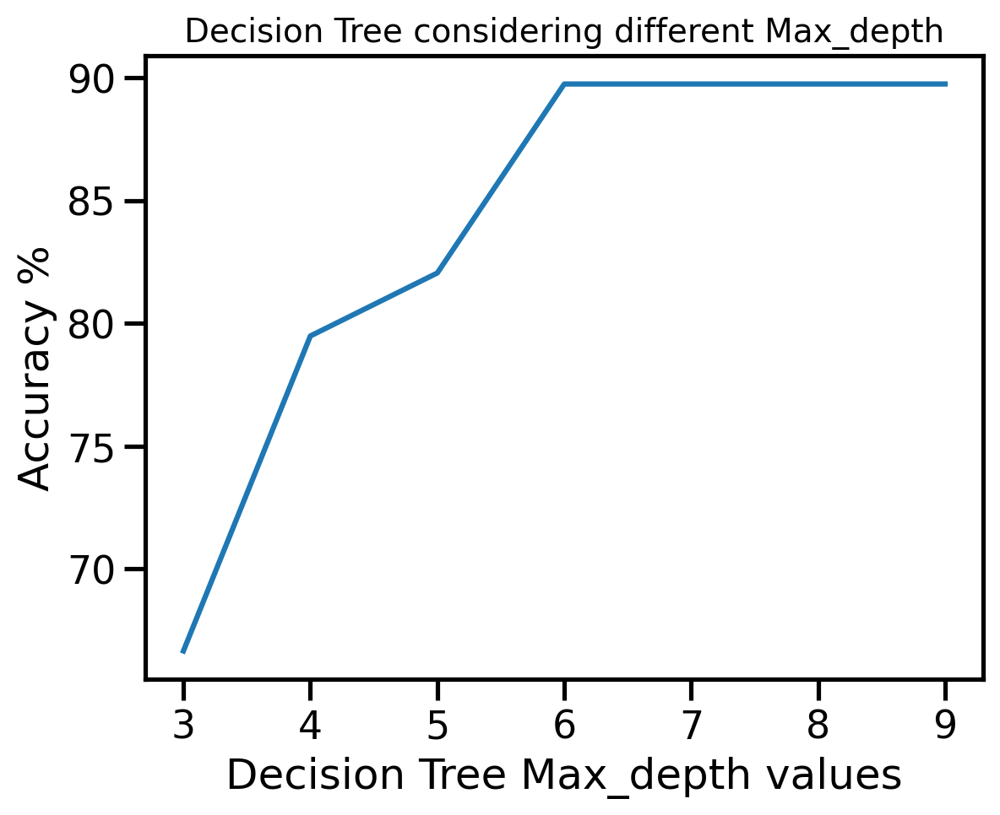

In [141]:
# Determine the best value for Max_depth
Maxdepth_list =   np.arange(3, 10)
# [3,5,7,9]
Decision_accuracy = []
for depth in Maxdepth_list:
    # creat the decisiontree classifier to train the data 
    classifier = DecisionTreeClassifier(max_depth=depth, random_state=0)
    classifier.fit(X_train,y_train)

    # predicition vale
    y_pred = classifier.predict(X_test)
        
    # Model accuracy
    accuracy = metrics.accuracy_score(y_test,y_pred)*100
    Decision_accuracy. append(accuracy)

# Print the accuracy list
print("Accuracy:", Decision_accuracy)
    
# Visualise the accuracy based on the tree max_depth
plt.title('Decision Tree considering different Max_depth',fontsize = 14)
plt.plot(Maxdepth_list, Decision_accuracy)
# ,'ro-',label = 'Testing Accuracy')
# plt.plot(neighbors, train_accuracy,'bo-', label = 'Training accuracy')
# plt.legend()

plt.xlabel('Decision Tree Max_depth values')
plt.ylabel('Accuracy %')
plt.show()

The previous figure shows that the best value for the max_depth parameter is 7

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 7,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 0,
 'splitter': 'best'}
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        20
           1       0.89      0.89      0.89        19

    accuracy                           0.90        39
   macro avg       0.90      0.90      0.90        39
weighted avg       0.90      0.90      0.90        39

Accuracy: 89.74358974358975


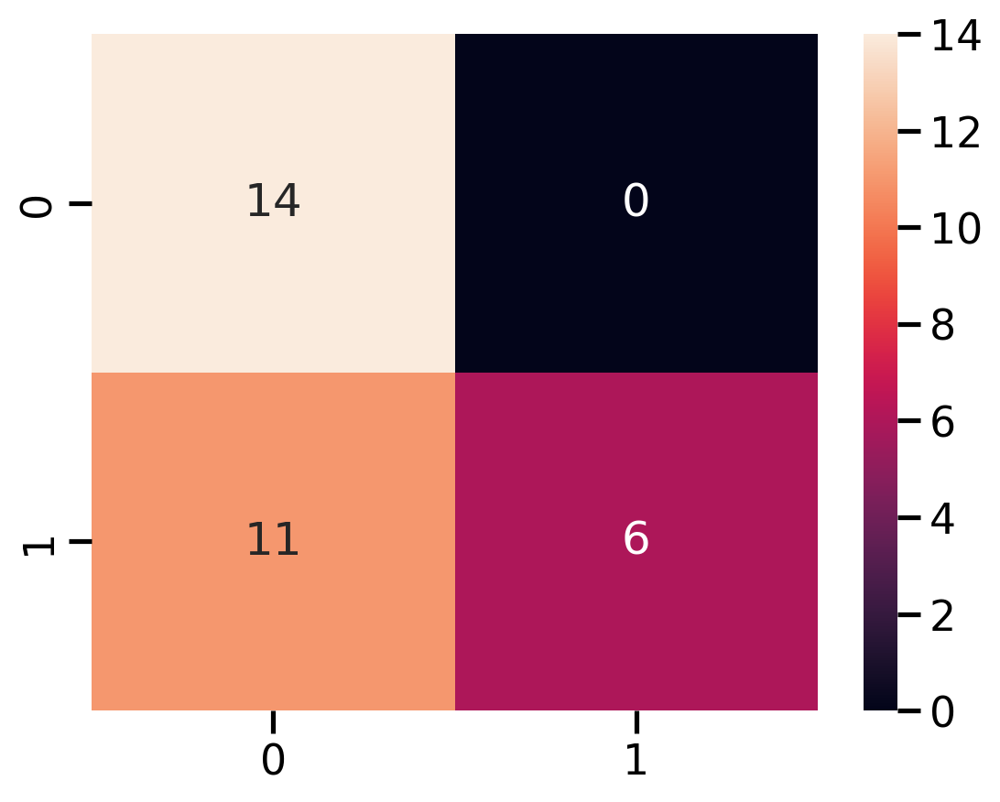

In [142]:
# max_depth=7
# creat the decisiontree classifier to train the data 
classifier = DecisionTreeClassifier(max_depth=7, random_state=0)
classifier.fit(X_train,y_train)

#  DecisionTree Parameters
pprint.pprint(classifier.get_params())

# predicition vale
y_pred = classifier.predict(X_test)


cm1 = confusion_matrix(y_test,y_pred)
sns.heatmap(cm,annot=True);
print(classification_report(y_test,y_pred))

# Model accuracy
print("Accuracy:",metrics.accuracy_score(y_test,y_pred)*100) 

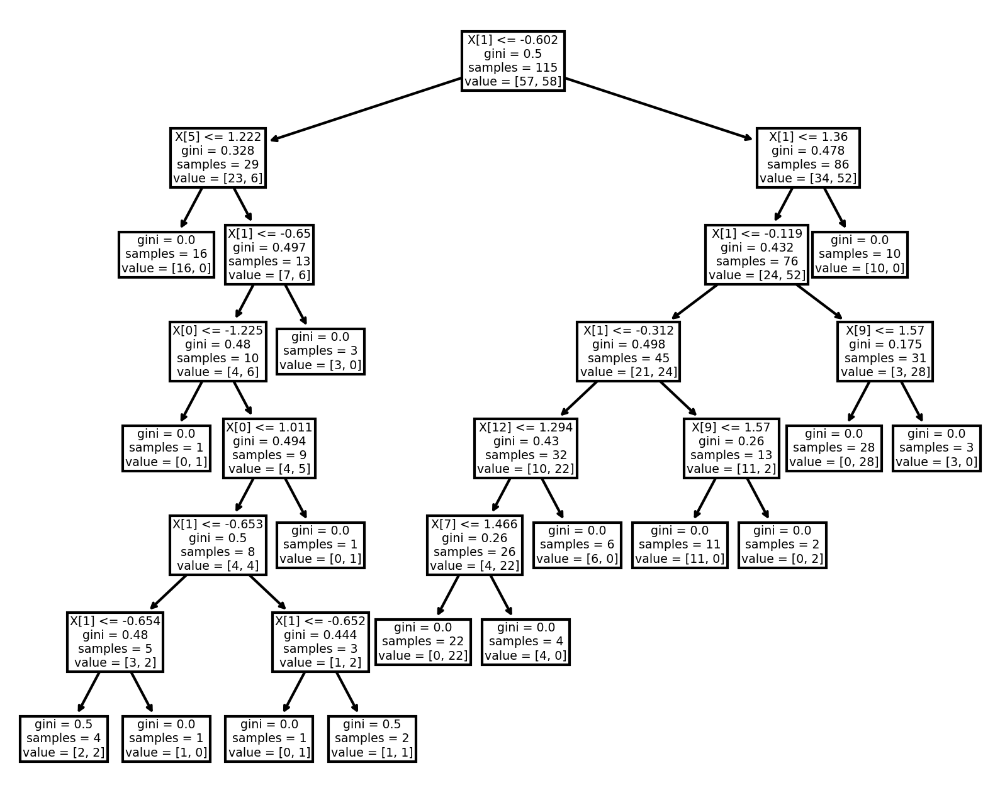

In [143]:
# Plot the decission tree at max_depth = 7
plt.figure(figsize=(10,8))
tree.plot_tree(classifier.fit(X_train,y_train)); 

**Use of Cross Validation with Decission Tree:**

In [144]:
scores=cross_val_score(classifier, X,y,cv=10,scoring='accuracy')
print(scores,'\n',scores.mean())                          # The scores is a list for cross validation(cv=10) 

[0.875      0.75       0.875      0.9375     0.73333333 0.86666667
 0.93333333 0.8        0.86666667 0.86666667] 
 0.8504166666666668


The accuracy for our Decission tree classifier with max-depth = 7 is Applying the cross validation on the decission tree model did not enhance its performance as the mean accuracy with cross validation = 10 is 85%.

<br>

**RandomForest:**

In [145]:
X = df_Ireland_melted.drop(columns='Trade',axis=1).values     # features columns from 2015 to the Total Gross
y = df_Ireland_melted.Trade.values                                  # Target column

# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

# Scaling the numeric values of the data
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [146]:
scores= []
for k in range(1,100):
    rfc = RandomForestClassifier(n_estimators=k)
    rfc.fit(X_train, y_train)
    y_pred = rfc.predict(X_test)
    scores.append(metrics.accuracy_score(y_test, y_pred))

The maximun accuracy is 0.9354838709677419 for the n_estimatore=9



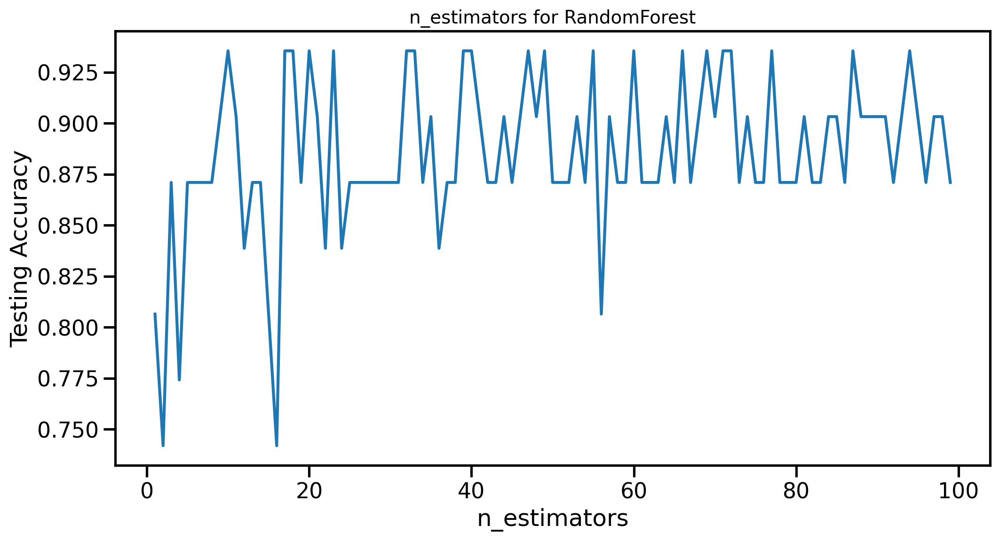

In [147]:
# Visualise the accuracy based on the number of estimators
plt.figure(figsize=(12,6))
plt.title('n_estimators for RandomForest',fontsize =14)
plt.plot(range(1,100),scores)
plt.xlabel('n_estimators')
plt.ylabel('Testing Accuracy')
print(f'The maximun accuracy is {max(scores)} for the n_estimatore={scores.index(max(scores))}\n')
plt.show()


 Accuracy 87.09677419354838
              precision    recall  f1-score   support

           0       0.92      0.79      0.85        14
           1       0.84      0.94      0.89        17

    accuracy                           0.87        31
   macro avg       0.88      0.86      0.87        31
weighted avg       0.88      0.87      0.87        31



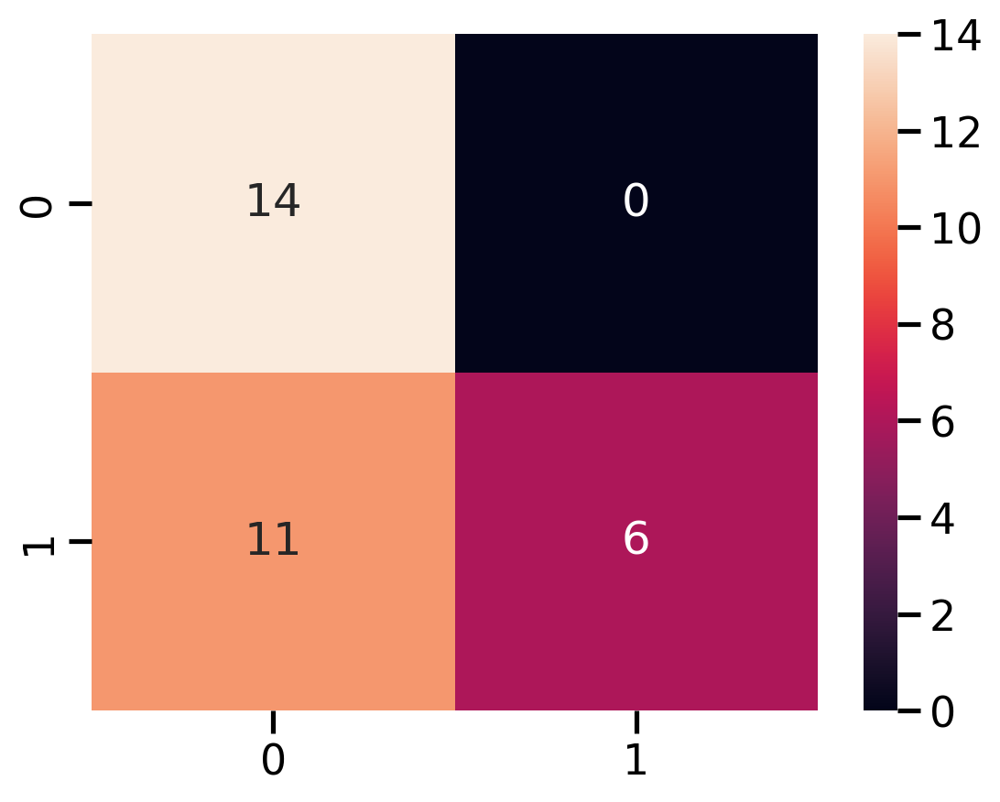

In [148]:
# Creat the Random Forest Classifier
clf = RandomForestClassifier(n_estimators=11)
clf.fit(X_train,y_train)

# DecisionTree Parameters
# pprint.pprint(clf.get_params())

# predicition vale
y_pred = clf.predict(X_test)

print('\n Accuracy',metrics.accuracy_score(y_test,y_pred)*100)

# Plot the Confusion matrix
cm2 = confusion_matrix(y_test,y_pred)
sns.heatmap(cm,annot=True)
print(classification_report(y_test,y_pred))

**Use of Cross Validation with Random Forest:**

In [149]:
scores=cross_val_score(clf, X,y,cv=10,scoring='accuracy')
print(scores,'\n',scores.mean())                          # The scores is a list for cross validation(cv=10)  

[0.9375     0.875      1.         0.9375     0.86666667 0.93333333
 0.93333333 0.93333333 1.         0.8       ] 
 0.9216666666666669



The accuracy for our Random Forest classifier with n-estimator = 9 is 87%.
Applying the cross validation on the decission tree model increase the model accuracy, the mean accuracy with cross validation = 10 is 92.7%.

<br>

**Naive Bayes:**
<br>
Naive Bayes algorithms are supervised learning algorithm that uses Bayes’ theorem to predict the class of a new piece of data. The algorithm assumes that the features of the data are independent, which means that the class of a data point does not depend on the values of any of the other data points.

scikit-learn.org. (n.d.). 1.9. Naive Bayes — scikit-learn 0.24.2 documentation. [online] Available at: http://scikit-learn.org/stable/modules/naive_bayes.html.

‌

In [150]:
X = df_Ireland_melted.drop(columns='Trade',axis=1).values     # features columns from 2015 to the Total Gross
y = df_Ireland_melted.Trade.values                                  # Target column

# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

# Scaling the numeric values of the data
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test) 

In [151]:
# Create and initialise an object sc by calling a method GaussianNB()
nvclassifier = GaussianNB()

# Train the model by calling a method fit()
nvclassifier.fit(X_train, y_train)
# Predicting the Test set results
y_pred = nvclassifier.predict(X_test) 

In [152]:
# Check the actual and predicted value side by side
y_compare = np.vstack((y_test, y_pred)).T
# actual value on the left side and predicted value on the right hand side
y_compare[:, :]

array([[0, 1],
       [0, 1],
       [1, 0],
       [1, 1],
       [0, 0],
       [0, 1],
       [0, 0],
       [1, 0],
       [1, 1],
       [1, 1],
       [0, 1],
       [1, 0],
       [0, 1],
       [0, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 1],
       [0, 1],
       [1, 1],
       [0, 1],
       [0, 0],
       [0, 1],
       [1, 0],
       [1, 1],
       [1, 0],
       [1, 0],
       [1, 0],
       [0, 0],
       [1, 1],
       [1, 1]])

[[ 4 10]
 [ 7 10]]


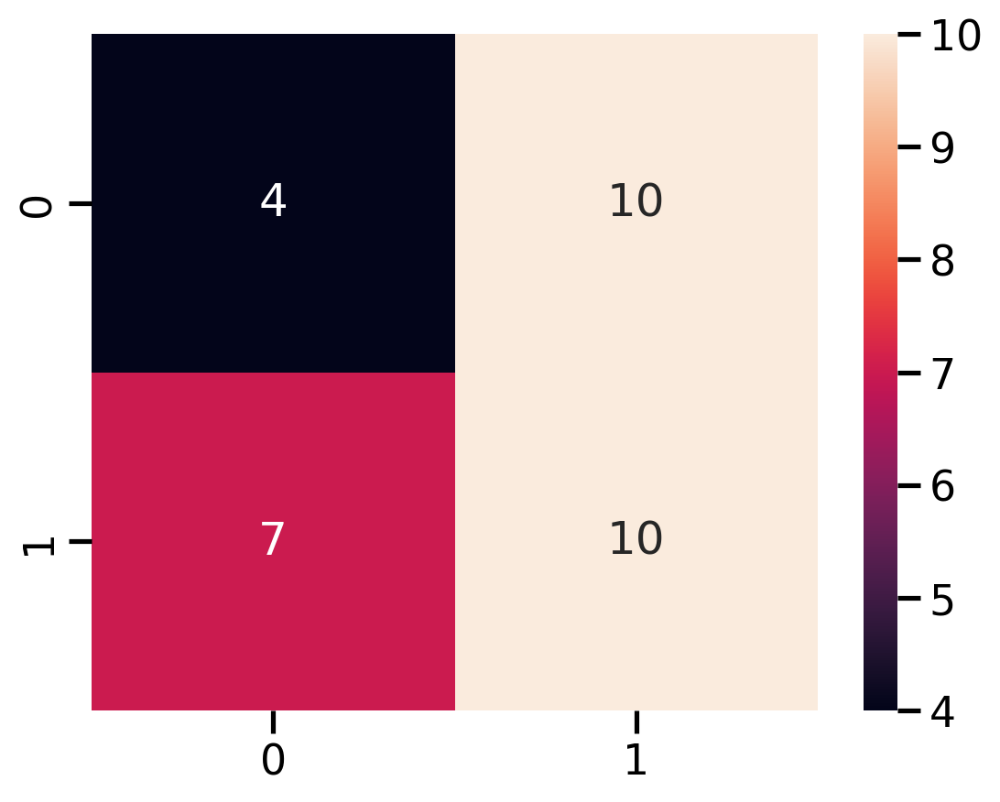

In [153]:
# Construct the Confusion Matrix
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm,annot= True)
print(cm)

In [154]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

# Rounded upto 2 decimal places
print( "Accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)*100) )

Accuracy: 0.45161290322580644
Accuracy: 45.16


**Use of Cross Validation with Naive Bayes:**

In [155]:
for cross in np.arange(5, 30,5):
    nvclassifier = GaussianNB()
    NB_accuracy = cross_val_score(nvclassifier, X, y, scoring='accuracy', cv = cross).mean() 
    print(f'for the cross validation  = {cross} ,  the accuracy = {NB_accuracy}')

for the cross validation  = 5 ,  the accuracy = 0.5324731182795699
for the cross validation  = 10 ,  the accuracy = 0.5175
for the cross validation  = 15 ,  the accuracy = 0.5575757575757575
for the cross validation  = 20 ,  the accuracy = 0.5491071428571429
for the cross validation  = 25 ,  the accuracy = 0.5380952380952381


Different Cross validations values tested, Using the cross validation improve the performane of the Naive Bayes model 

**Support Vector Machines:**
<br>
A support vector machine is a supervised machine learning algorithm that is often considered to be very accurate and efficient with less computation power. This is thanks to the way that it uses a simplified set of features to predict which class a new obbservation will belong to.

In [156]:
X = df_Ireland_melted.drop(columns='Trade',axis=1).values     # features columns from 2015 to the Total Gross
y = df_Ireland_melted.Trade.values                                  # Target column

# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

# Scaling the numeric values of the data
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)  

In [157]:
SVM_accuracy_list = []
for c_value in range(1,9):
    # Create an object svmModel by calling a method SVC()
    svmModel = SVC(kernel = 'rbf',C = c_value, gamma = 0.9)

    # Train the model by calling a method fit()
    svmModel.fit(X_train,y_train)

    # Store the predicted values into y_pred
    Y_pred = svmModel.predict(X_test)
    SVM_accuracy_list.append(Y_pred)

    # Display the accuracy upto 2 decimal places
    print(f'for c= {c_value}, Accuracy in SVC = ', round(accuracy_score(y_test, Y_pred)*100,2))    

for c= 1, Accuracy in SVC =  58.06
for c= 2, Accuracy in SVC =  61.29
for c= 3, Accuracy in SVC =  70.97
for c= 4, Accuracy in SVC =  70.97
for c= 5, Accuracy in SVC =  70.97
for c= 6, Accuracy in SVC =  74.19
for c= 7, Accuracy in SVC =  77.42
for c= 8, Accuracy in SVC =  77.42


<br>

In [158]:
scores=cross_val_score(svmModel, X,y,cv=10,scoring='accuracy')
print(scores,'\n',scores.mean())                          # The scores is a list for cross validation(cv=10) 

[0.6875     0.6875     0.6875     0.75       0.53333333 0.53333333
 0.46666667 0.6        0.66666667 0.6       ] 
 0.62125


**Linear Regression:**

In [159]:
X = df_Ireland_melted[['Year']]                         # features column'Year'
y = df_Ireland_melted['Value $M']                                  # Target column 'Value'

# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

# Scaling the numeric values of the data
# sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)


0.01585074081876292 -0.13406265586178812


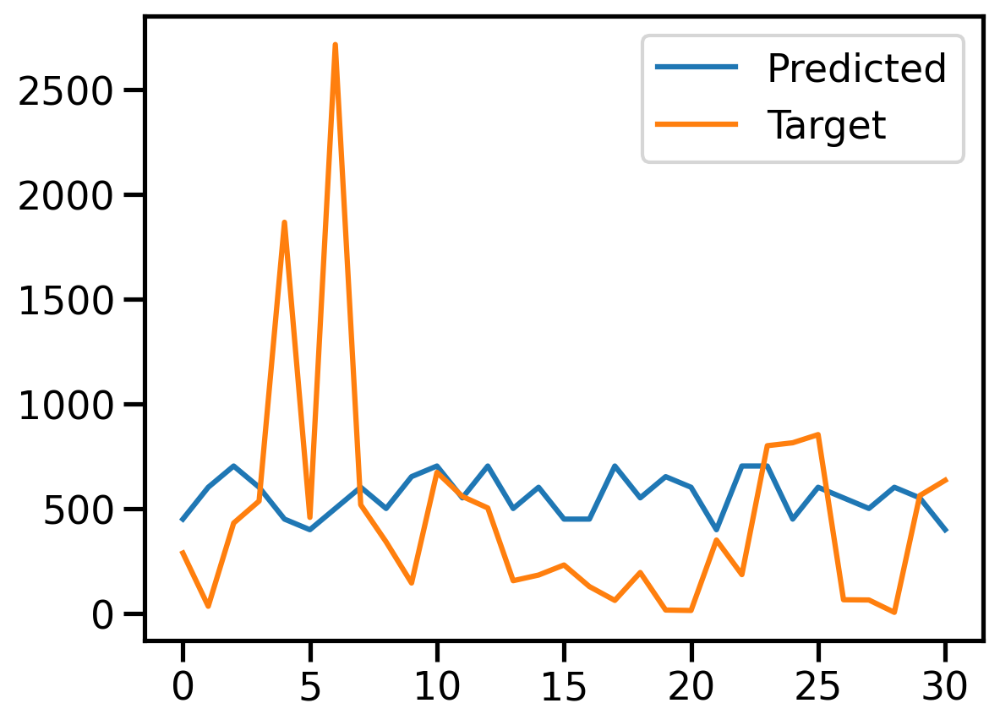

In [160]:
# Fit the model
my_lm = LinearRegression()
my_lm.fit(X = X_train, y = y_train)

# Calculate the train and test Forecasting
train_fcst = my_lm.predict(X_train)
test_fcst = my_lm.predict(X_test)

# Calculate the r2 score for train and test
train_r2 = r2_score(y_train, train_fcst)
test_r2 = r2_score(y_test, test_fcst)

# Display the results for train and test
print(train_r2, test_r2)

# Plot result
# plt.plot(list(y_train),label='Train')
plt.plot(list(test_fcst),label='Predicted')
plt.plot(list(y_test),label='Target')

plt.legend()

The R-squared of the model in training set is: 0.0158 and R-squared of the model in test set is: -0.1241. That means linear regression performance is inferior and not suitable for our dataset. The Linear regression tries to fit a straight line, but the -ve result indicates that the relation between the 'Value' column and the 'Year' is complex and non-linear.


In [161]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

regression = linear_model.LinearRegression()
regression.fit(X_train, y_train)

prediction = regression.predict(X_test)

mean_squared_score = mean_squared_error(y_test, prediction)

print("MEAN SQUARED SCORE", mean_squared_score)

MEAN SQUARED SCORE 345654.72371465917


Root mean squared error of the prediction is: 320041.277773838

<br>

**Ridge Regression**

In [162]:
X = df_Ireland_melted[['Year']]                         # features column'Year' &'Trade'
y = df_Ireland_melted['Value $M']                                  # Target column 'Value'

# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

# Scaling the numeric values of the data
# sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)


In [163]:
# Using GridSearch for parameter optimization
ridgeregr = GridSearchCV(Ridge(),
                    param_grid={
                        'alpha': [0.01, 0.1, 1]
                    }, verbose=1)
#  Fit the model
ridgeregr.fit(X_train, y_train)
ridge = ridgeregr.best_estimator_

Fitting 5 folds for each of 3 candidates, totalling 15 fits


In [164]:
# Making predictions here
y_preds_train = ridge.predict(X_train)
y_preds_test_ridge = ridge.predict(X_test)

print("R-squared of the model in training set is: {}".format(ridge.score(X_train, y_train)))
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(ridge.score(X_test, y_test)))
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_preds_test_ridge)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_ridge) / y_test)) * 100))

R-squared of the model in training set is: 0.015849709943319468
-----Test set statistics-----
R-squared of the model in test set is: -0.13290921570790526
Root mean squared error of the prediction is: 587.6250189184932
Mean absolute percentage error of the prediction is: 703.9143766690495


In [165]:
# Calculate the train Forecasting
y_preds_train = ridge.predict(X_train)
y_preds_test_ridge = ridge.predict(X_test)

# Calculate teh r2 score for train and test
Rtrain_r2 = r2_score(y_train, y_preds_train)
Rtest_r2 = r2_score(y_test, y_preds_test_ridge)

# Display the results for train and test
print(Rtrain_r2, Rtest_r2) 

0.015849709943319468 -0.13290921570790526


The R-squared of the model in training set is: 0.009696017495205767 and the R-squared of the model in test set is: -0.15062488725977974.
Ridge regression does not appear any performnce as the result Same as the linear regression. 

We try to use another model to can deal with the non linearity like a DecisionTreeRegressor
 

<br>

**Decision Tree Regressor:**

In [166]:
X = df_Ireland_melted[['Year']]                         # features column'Year' &'Trade'
y = df_Ireland_melted['Value $M']                                  # Target column 'Value'

# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

# Scaling the numeric values of the data
# sc = StandardScaler()
# X_train = sc.fit_transform(X_train)
# X_test = sc.transform(X_test)
# Split the data into train set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 1)

0.009696054920007247 -0.15073472276653788


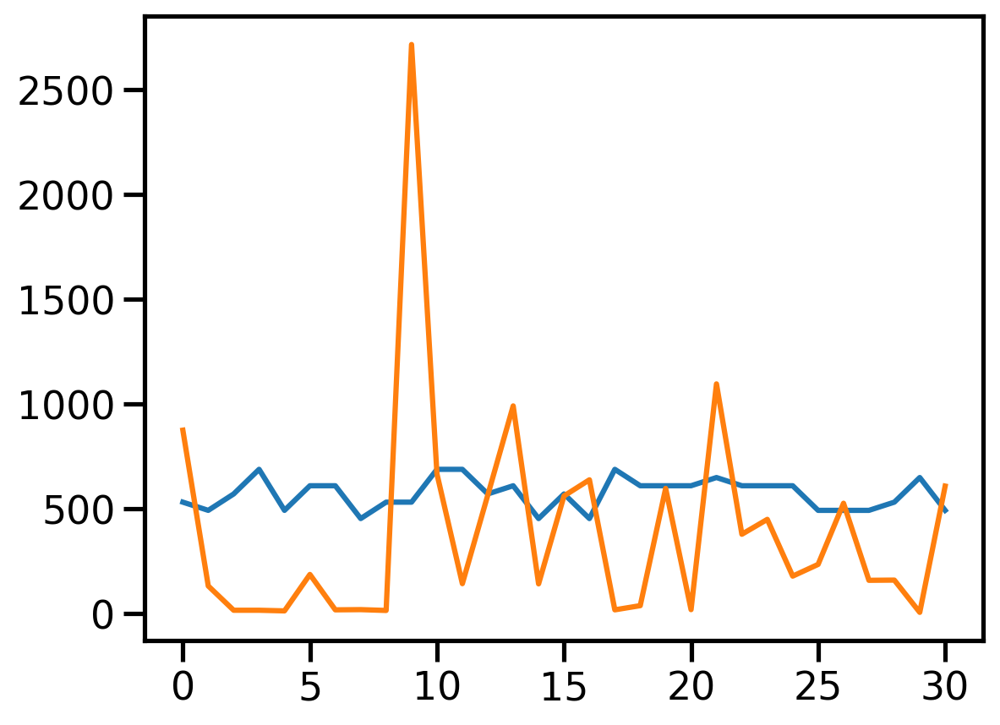

In [167]:
y_lm = LinearRegression()
my_lm.fit(X = X_train, y = y_train)

# Calculate the train Forecasting
train_fcst = my_lm.predict(X_train)
test_fcst = my_lm.predict(X_test)

# Calculate the r2 score for train and test
train_r2 = r2_score(y_train, train_fcst)
test_r2 = r2_score(y_test, test_fcst)

# Display the results for train and test
print(train_r2, test_r2)

# Plot result
plt.plot(list(test_fcst))
plt.plot(list(y_test))

In [168]:
# Fit the data
tree = DecisionTreeRegressor(max_depth=3).fit(X_train, y_train)
# Predict the results
target_predicted = tree.predict(X_test)
# Calculate the root mean squared error of the prediction 
mean_squared_err = mse(y_test, target_predicted)

# Calculate the r2 score for train and test
train_r2 = r2_score(y_train, train_fcst)
test_r2 = r2_score(y_test, test_fcst)
print(train_r2,test_r2)

0.009696054920007247 -0.15073472276653788


changing the model to the Decision Tree Regressor didn't suit our dataset. 

<br>


<br>

# Statistics

In [169]:
# We will study the exported crops and livestock products in the statistics section
# df_stat: is a data frame for the crops and livestock products exported by the European Union countries.
# df_stat_IRL: is a data farme for Ireland
df_stat = df.loc[df['Trade']=='Export']

In [170]:
# Rename the column 'Total Gross' -->'Total'
df_stat.rename(columns={'Total Gross': 'Total'}, inplace=True)

In [171]:
df_stat_IRL = df_stat.loc[df['Region']=='Ireland']
df_stat_IRL.reset_index(inplace=True, drop=True) 
df_stat_IRL.head()

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Total,Trade
0,Crops and livestock products,Ireland,Bovine Meat,2454,2508,2716,2874,2601,2660,2838,18653.84379,Export
1,Crops and livestock products,Ireland,Cereals,40,18,21,22,36,45,64,249.10032,Export
2,Crops and livestock products,Ireland,Dairy Products,1869,1868,2627,3013,3270,3314,3682,19647.23284,Export
3,Crops and livestock products,Ireland,Eggs,18,13,15,14,17,20,41,141.71600,Export
4,Crops and livestock products,Ireland,Fodder and Feeding Stuff,306,290,339,375,377,416,505,2610.96716,Export


The dataset(s) contain different data types:
    Categorical data include Nominal and ordinal data. Nominal data is in the 'Domain', 'Region', 'Productions', and 'Trade' columns where the categories(labels) are unrelated and are not in order, unlike the ordinal type. 
    
 The columns from '2015' to '2021' contain numeric values (intger). 
 The 'Total Gross' colum contain the continous value represt the export value in million $ 

In [172]:
df_stat.shape

(294, 12)

The sample size = 294

In [173]:
# we filter the data frame to get the numeric features only to caluculate the descriptive Statistics
df_stat_Num = df.iloc[:,3:11]
df_stat_Num.head()

,2015,2016,2017,2018,2019,2020,2021,Total Gross
0,543,500,550,561,546,526,589,3817.40904
1,413,416,451,433,461,527,592,3295.76317
2,1219,1196,1314,1423,1369,1483,1532,9540.37498
3,22,25,33,44,44,43,30,245.20825
4,756,748,838,961,949,1041,1194,6489.05085


Calculate the descriptive Statistics for the numeric features in our data frame like Min, Max, Mean, Standard Deviation, and Median

In [174]:

for i,val in enumerate(df_stat_Num):
    print(f'{val}:\nThe minimum of {val} is: {min(df_stat_Num[val])}')
    print(f'The maximum of {val} is: {max(df_stat_Num[val])}')
    print(f'The mean of {val} is: {(df_stat_Num[val]).mean():.3f}')
    print(f'The median of {val} is: {(df_stat_Num[val]).median():.3f}')
    print(f'The Standard deviation of {val} is: {df_stat_Num[val].std():.3f}\n') 

2015:
The minimum of 2015 is: 0
The maximum of 2015 is: 9418
The mean of 2015 is: 688.003
The median of 2015 is: 172.000
The Standard deviation of 2015 is: 1316.897

2016:
The minimum of 2016 is: 0
The maximum of 2016 is: 9833
The mean of 2016 is: 691.514
The median of 2016 is: 174.000
The Standard deviation of 2016 is: 1328.884

2017:
The minimum of 2017 is: 0
The maximum of 2017 is: 10637
The mean of 2017 is: 770.225
The median of 2017 is: 188.000
The Standard deviation of 2017 is: 1493.527

2018:
The minimum of 2018 is: 0
The maximum of 2018 is: 11379
The mean of 2018 is: 814.963
The median of 2018 is: 214.000
The Standard deviation of 2018 is: 1573.844

2019:
The minimum of 2019 is: 0
The maximum of 2019 is: 10322
The mean of 2019 is: 799.897
The median of 2019 is: 214.000
The Standard deviation of 2019 is: 1533.525

2020:
The minimum of 2020 is: 0
The maximum of 2020 is: 11761
The mean of 2020 is: 836.181
The median of 2020 is: 213.000
The Standard deviation of 2020 is: 1635.637



<br>

<br> We start to anlyse Ireland export dataset df_stat_IRL

In [175]:
df_stat_IRL

,Domain,Region,Production,2015,2016,2017,2018,2019,2020,2021,Total,Trade
0,Crops and livestock products,Ireland,Bovine Meat,2454,2508,2716,2874,2601,2660,2838,18653.84379,Export
1,Crops and livestock products,Ireland,Cereals,40,18,21,22,36,45,64,249.10032,Export
2,Crops and livestock products,Ireland,Dairy Products,1869,1868,2627,3013,3270,3314,3682,19647.23284,Export
3,Crops and livestock products,Ireland,Eggs,18,13,15,14,17,20,41,141.71600,Export
4,Crops and livestock products,Ireland,Fodder and Feeding Stuff,306,290,339,375,377,416,505,2610.96716,Export
5,Crops and livestock products,Ireland,Fruit,140,139,162,197,177,185,187,1189.91805,Export
6,Crops and livestock products,Ireland,Nuts,5,3,3,5,7,4,5,34.13922,Export
7,Crops and livestock products,Ireland,Pigmeat (meat equivalent),460,525,554,570,596,663,675,4045.17407,Export
8,Crops and livestock products,Ireland,Poultry Meat,352,280,306,347,307,281,279,2155.91462,Export
9,Crops and livestock products,Ireland,Roots and Tubers,10,11,13,12,16,15,16,94.93483,Export


In [176]:
df_stat_IRL.shape

(11, 12)

Calculate the yearly average value for crops and livestock product exports from Ireland.

In [177]:
IRL_MeanExp = df_stat.iloc[:,3:10].sum(0)
IRL_MeanExp

2015    211734
2016    212833
2017    235854
2018    248041
2019    246320
2020    260563
2021    286793
dtype: int64

**One Sample T-test:** The one-sample t-test is a statistical hypothesis test used to test if the unknown population mean is different from a specific value. 

In [178]:
# Calculate the actual mean of the export yearly over 2015-2021
IRL_MeanExp.mean()

243162.57142857142

We need to set a hypothesized mean(the mean we'd like to test, or the mean we'd expect in the population). 
Here, I'd like to test if the export price for all comidities exported by Ireland in million $ in the population would be 250000.

Null Hypothesis:          --> H0 = µ, Population means  
Alternative hypothesis:   --> H1 ≠ µ, Population means

Suppose: µ = 250000 K$

In [179]:
# Define the variable 
#x = The total trade(in Millioneuros)
X = IRL_MeanExp

The ttest_1samp function used to get the results:

In [180]:
# The mean of Total Gross is: 5523.347
stats.ttest_1samp(X,250000)

Ttest_1sampResult(statistic=-0.6836443174277725, pvalue=0.5197138596447316)

Let's describe the result, we got two values the first is the statistic=-0.68364431,it is the t-value and, the p-value which is 0.519, which is greater than 0.05, so we accept the null hypothesis and the alternative hypothesis is rejected. 
 There is enough evidence to say that the average of exported crops is 250000 yearly.

<br>

**If we want to test if the yearly export cost in $Million is less than  €250000 M. We calculate the test at alpha = 5% significance level.** 

In [181]:
#H1 : u < 5000
stats.t.sf(-0.6836443174277725, 294) 

0.7526308827750456

Again, the p-value = 0.75> 0.05. We accept the null hypothesis H0. Thus, there is enough evidence to say that the yearly export price in average greater than $ Million 250000.

<br>
<br>

**T-Test, two populations**

Suppose we want to test if there any difference in the average of the 'Total Gross'between import and export crops and livestock in Ireland at a 5% significante level.

In [182]:
# Have a look to df_melted 
df_melted

,Domain,Region,Production,Trade,Year,Value
0,Crops and livestock products,Austria,Bovine Meat,Export,2015,543
1,Crops and livestock products,Austria,Cereals,Export,2015,413
2,Crops and livestock products,Austria,Dairy Products,Export,2015,1219
3,Crops and livestock products,Austria,Eggs,Export,2015,22
4,Crops and livestock products,Austria,Fodder and Feeding Stuff,Export,2015,756
...,...,...,...,...,...,...
4132,Crops and livestock products,Sweden,Nuts,Import,2021,207
4133,Crops and livestock products,Sweden,Pigmeat (meat equivalent),Import,2021,343
4134,Crops and livestock products,Sweden,Poultry Meat,Import,2021,323
4135,Crops and livestock products,Sweden,Roots and Tubers,Import,2021,126


In [183]:
# df_stat_IRL['Total'] = df_stat_IRL['Total'].astype(int)

In [184]:
# Filter the dataframe to get Ireland only
IRL = df_melted[df_melted['Region'] == 'Ireland']
IRL.head()

,Domain,Region,Production,Trade,Year,Value
285,Crops and livestock products,Ireland,Bovine Meat,Export,2015,2454
286,Crops and livestock products,Ireland,Cereals,Export,2015,40
287,Crops and livestock products,Ireland,Dairy Products,Export,2015,1869
288,Crops and livestock products,Ireland,Eggs,Export,2015,18
289,Crops and livestock products,Ireland,Fodder and Feeding Stuff,Export,2015,306


In [185]:
# We group the data according to import and export trade values
importCrops = IRL[IRL['Trade'] == 'Import']['Value']
exportCrops = IRL[IRL['Trade'] == 'Export']['Value']

In [186]:
# H0 => µ1 = µ2 (population mean of importCrops is equal to exportCrops)
# HA => µ1 ≠µ2 (population mean of importCrops is different from exportCrops) 

In [187]:
# We perform the test assuming as H0 that mu1 = mu2 (importCrops = exportCrops) 
# equal_var=True means that we take in consideration the equal population variances.
test = stats.ttest_ind(importCrops, exportCrops, 
                      equal_var=True)

print (test)

Ttest_indResult(statistic=-1.8883506807233879, pvalue=0.06088428027866394)


In [188]:
# We perform the test assuming as H0 that mu1 = mu2 (importCrops = exportCrops) 
# equal_var=False means the population variances are not equal.
test = stats.ttest_ind(importCrops, exportCrops, 
                      equal_var=False)

print (test)

Ttest_indResult(statistic=-1.888350680723388, pvalue=0.062178394159737846)


pvalue = 0.06 >0.05 We cannot reject the null hypothesis H0. There is enough evidence at 5% significance level  to say that the population mean of importCrops is equal to exportCrops.

<br>

Compare the values of Import and export products in Ireland:

**ANOVA**(Analysis of Variance)

Checking the ANOVA conditions:
* **Independency:** The k populations are independent. In other words, their outcomes do not affect each other.
* **Normality:** The k populations have a normal distribution.
* **Variance Equality:** The variances of the k normal distributions are equal. 

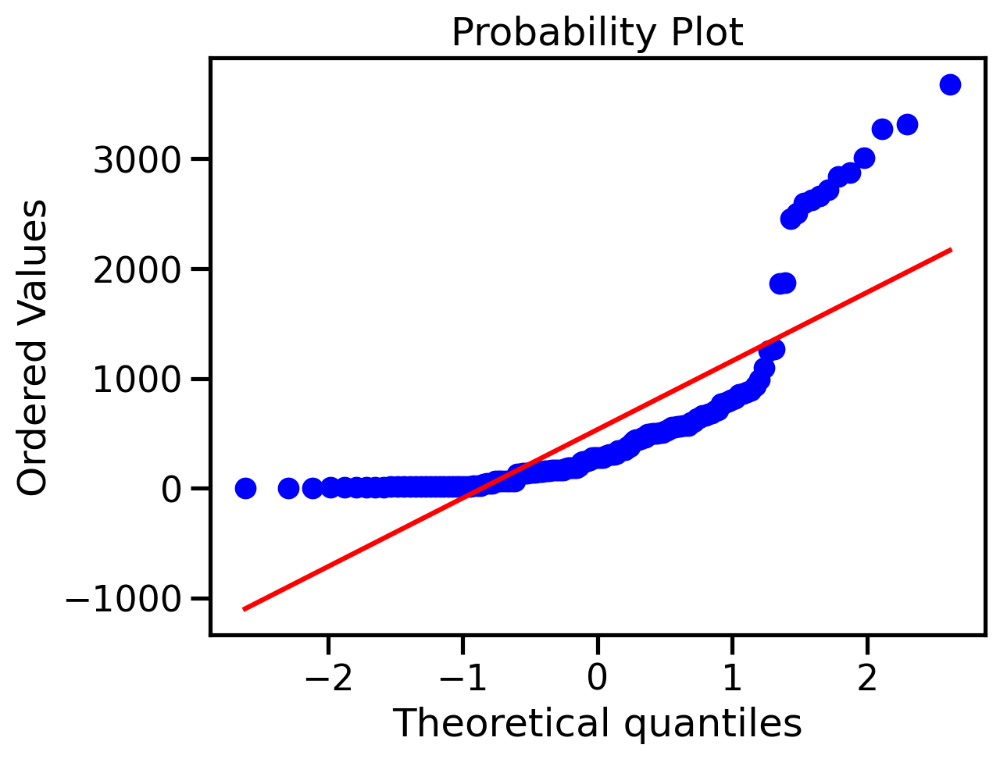

<Figure size 640x480 with 0 Axes>

In [189]:
# Normality plot
stats.probplot(IRL['Value'], plot=plt);
plt.figure();

In [190]:
The figure shows that the data is not normally distributed

SyntaxError: invalid syntax (2096705147.py, line 1)

**Shapiro**

We apply the Shapiro wilk test to check if the sample data came from a normal distribution or not.
* H0 : The data narmally distributed <br>
* H1 :The data is not normally distributed

In [ ]:
#Shapiro wilk test
stats.shapiro(IRL.Value) 

In [ ]:
the p-value < 0.05, We reject the Null hypothesis. This enough evidence to say that the data is not normally distributed. 

<br>

**Comparing Ireland crops and livestock products exports with Netherlands(the highest export country in EU).** 

In [ ]:
df_melted

Compare Ireland exported crops and livestock product with Franc and Spain

In [ ]:
# Filter data to extract the dataset for Ireland, France, and Spain
# List for the three regions selected
NewRegion = ['Ireland', 'France','Spain'] 

# Get the dataset for thev New_region
df_NewRegion = df_melted[df_melted['Region'].isin(NewRegion)]

# Reset the index of the filtered data
df_NewRegion.reset_index(drop= True,inplace=True)

# new dataset 
data = df_NewRegion[df_NewRegion['Trade']=='Export']

In [ ]:
data.head()

We want to check if the average value(prices in $M) for the exported crops and livestock products for the three regions are the same or not. Let's check our randam sample stored in 'data'

**ANOVA**

In [ ]:
#Normality plot. Our variable is "Value"
stats.probplot(data['Value'], plot=plt);
plt.figure();

The figures display the 'Value' data points which form a curve rather than a straight line which confirms a skewness in the dataset sample.  

**Shapiro**

We apply the Shapiro wilk test to check if the sample data came from a normal distribution or not.
* H0 : The data narmally distributed <br>
* H1 :The data is not normally distributed


In [ ]:
#Shapiro wilk test
stats.shapiro(data.Value)

the p-value < 0.05, We reject the Null hypothesis. This enough evidence to say that the data is not normally distributed. 

<b>

In [ ]:
Apply shapiro test for the three region seperately:

In [ ]:
#Shapiro wilk test 
stats.shapiro(data.Value[data.Region == 'Ireland'])

In [ ]:
#Shapiro wilk test 
stats.shapiro(data.Value[data.Region == 'France'])

In [ ]:
#Shapiro wilk test 
stats.shapiro(data.Value[data.Region == 'Spain'])

In [ ]:
stats.t.interval(alpha=0.95, df_stat=len(data)-1, loc=np.mean(data), scale=st.sem(data)) 


The Pvalue < 0.05 in the three regions, that's confirm that the data is not normally distributed

<br>

Calculate the variane for each reion sample

In [ ]:
Ireland = data.Value[data.Region == 'Ireland']
sd1 = Ireland.std()
sd1

In [ ]:
France = data.Value[data.Region == 'France']
sd2 = France.std()
sd2

In [ ]:
Spain = data.Value[data.Region == 'Spain']
sd3 = Spain.std()
sd3

**Levenes test**

consider alpha = 0.05

In [ ]:
#Homogeinity of variance: 
from scipy.stats import levene
levene(Ireland, Spain, France, center = 'mean')

In [ ]:
p-value is less than alpha, then we reject the null hypothesis, there is no enough evidence to say the variances are equal.

References:

[1] Corporate Finance Institute. (n.d.). Imports and Exports. [online] Available at: https://corporatefinanceinstitute.com/resources/economics/imports-and-exports/.

[2] Stack Overflow. (n.d.). python - what is matplotlib’s retina display mode? [online] Available at: https://stackoverflow.com/questions/54312924/what-is-matplotlibs-retina-display-mode [Accessed 24 Dec. 2022].

[3] Stack Overflow. (n.d.). python - How to include an image in a Jupyter Lab notebook. [online] Available at: https://stackoverflow.com/questions/61305845/how-to-include-an-image-in-a-jupyter-lab-notebook [Accessed 24 Dec. 2022].

[4] Stack Overflow. (n.d.). python del vs pandas drop. [online] Available at: https://stackoverflow.com/questions/47426089/python-del-vs-pandas-drop#:~:text=
drop%20operates%20on%20both%20columns [Accessed 16 Dec. 2022]

[5] pandas.pydata.org. (n.d.). pandas.DataFrame.shape — pandas 1.2.1 documentation. [online] Available at: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.shape.html.

[6] Simplilearn.com. (2021). Comments in Python: Why are They Important And How to Use Them. [online] Available at: https://www.simplilearn.com/tutorials/python-tutorial/comments-in-python#:~:text=Python%20provides%20an%20in%2Dbuilt [Accessed 28 Dec. 2022].

[7] pandas.pydata.org. (n.d.). pandas.DataFrame.describe — pandas 1.3.4 documentation. [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html.

[8] GeeksforGeeks. (2018). Reset Index in Pandas Dataframe. [online] Available at: https://www.geeksforgeeks.org/reset-index-in-pandas-dataframe/ [Accessed 26 Dec. 2022].

[9] plotly.com. (n.d.). Filled. [online] Available at: https://plotly.com/python/filled-area-plots/.


[10]
    

    